In [10]:
library(igraph)
library(resample)
library(textTinyR)
library(Matrix)
library(pracma)

# Generating Random Networks

## Question 1a

[1] "p=0.003: Mean=3.048000, Variance=3.054751"


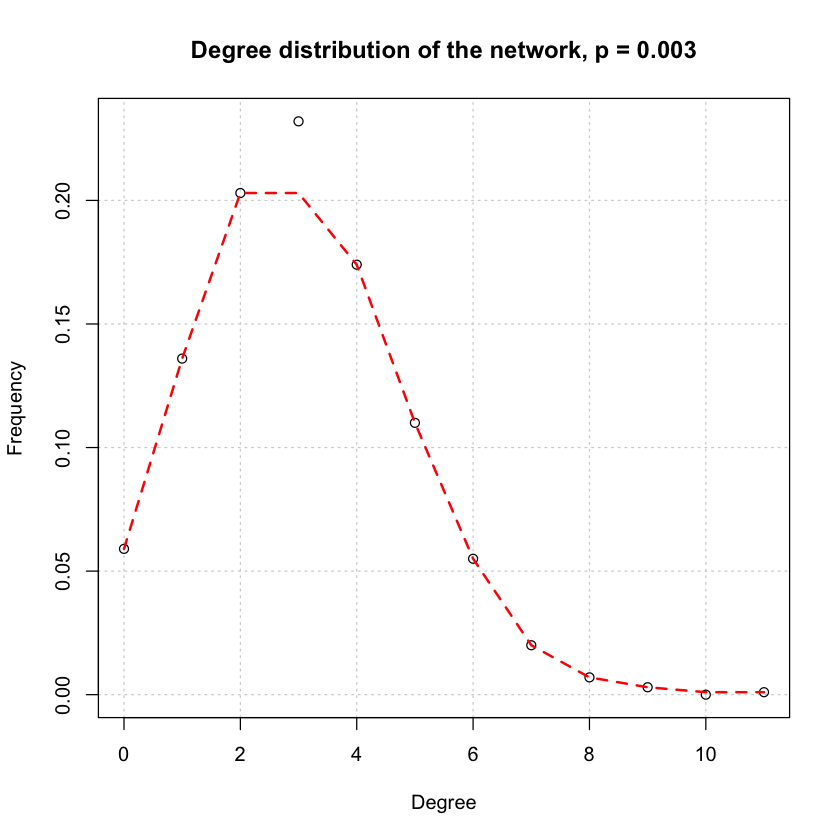

[1] "p=0.004: Mean=4.086000, Variance=3.892496"


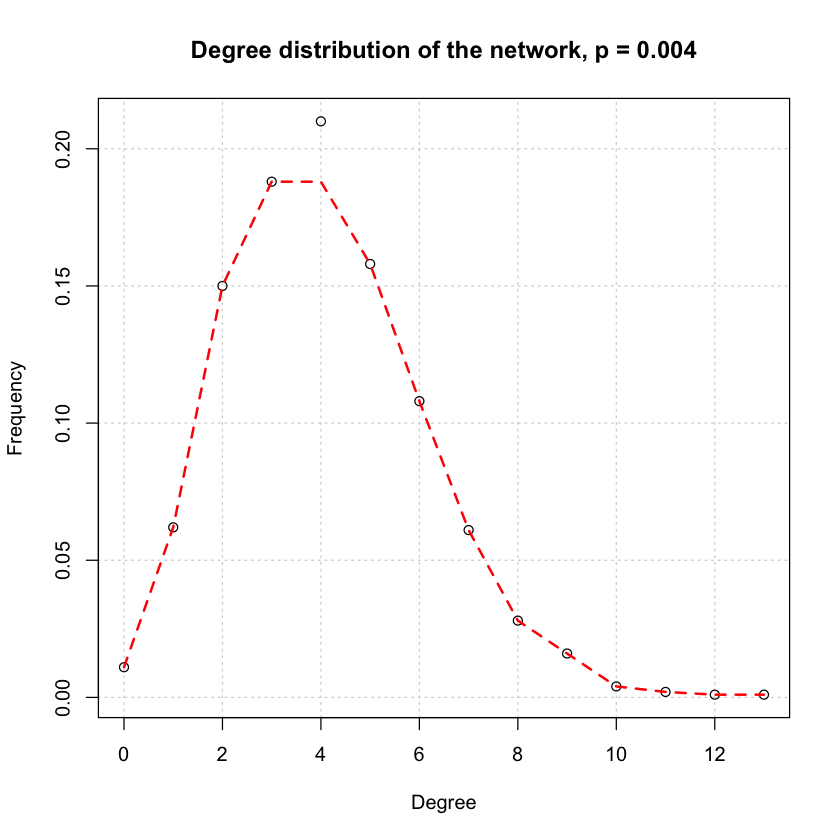

[1] "p=0.010: Mean=9.776000, Variance=10.372196"


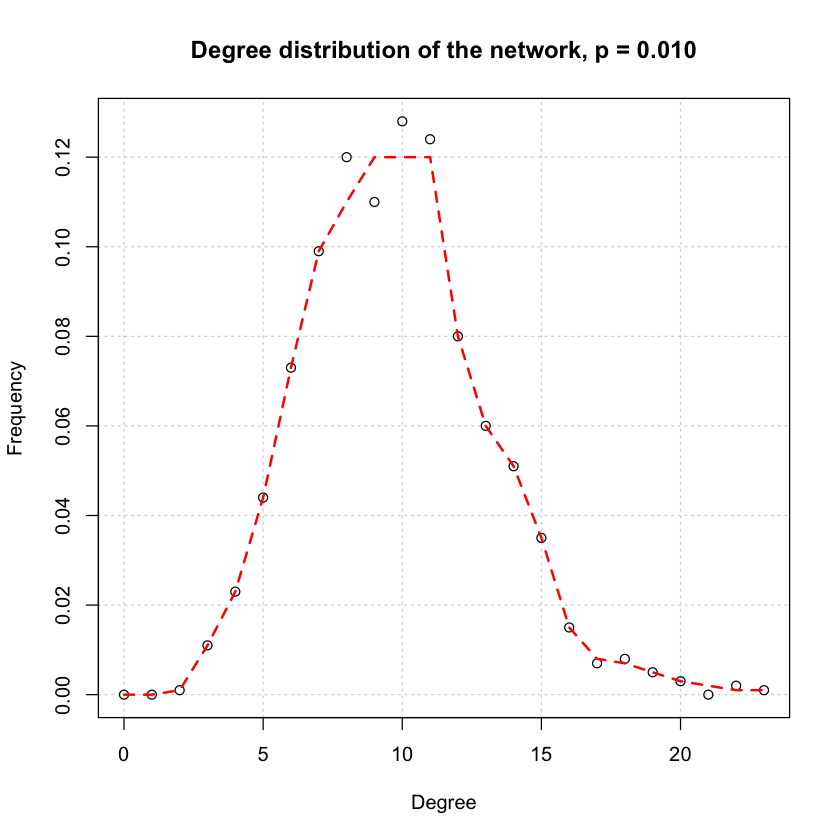

[1] "p=0.050: Mean=49.880000, Variance=44.820420"


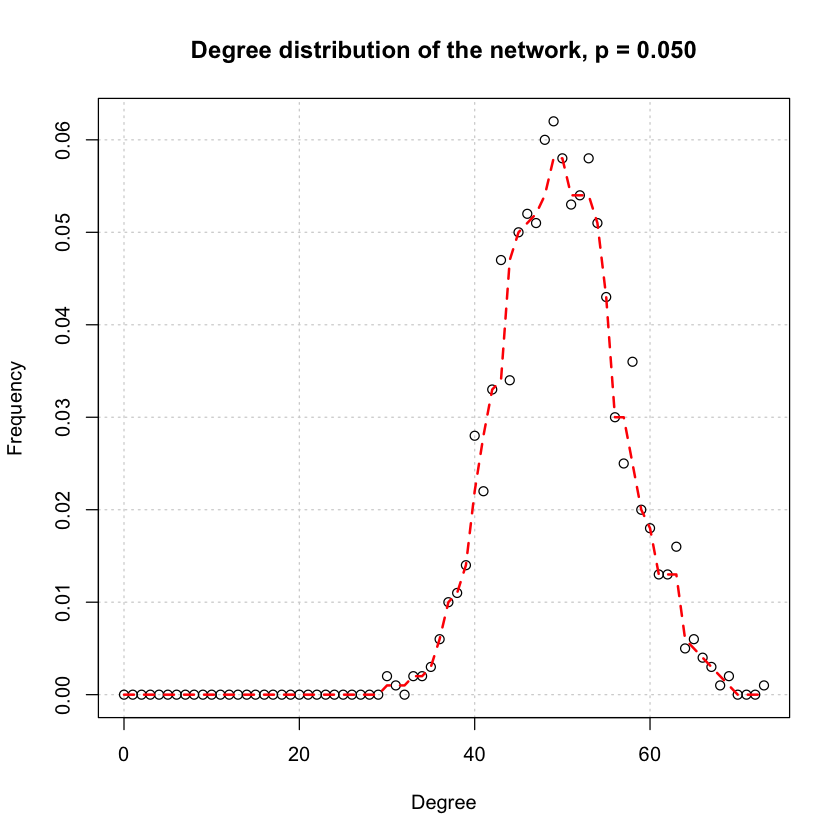

[1] "p=0.100: Mean=100.354000, Variance=85.502186"


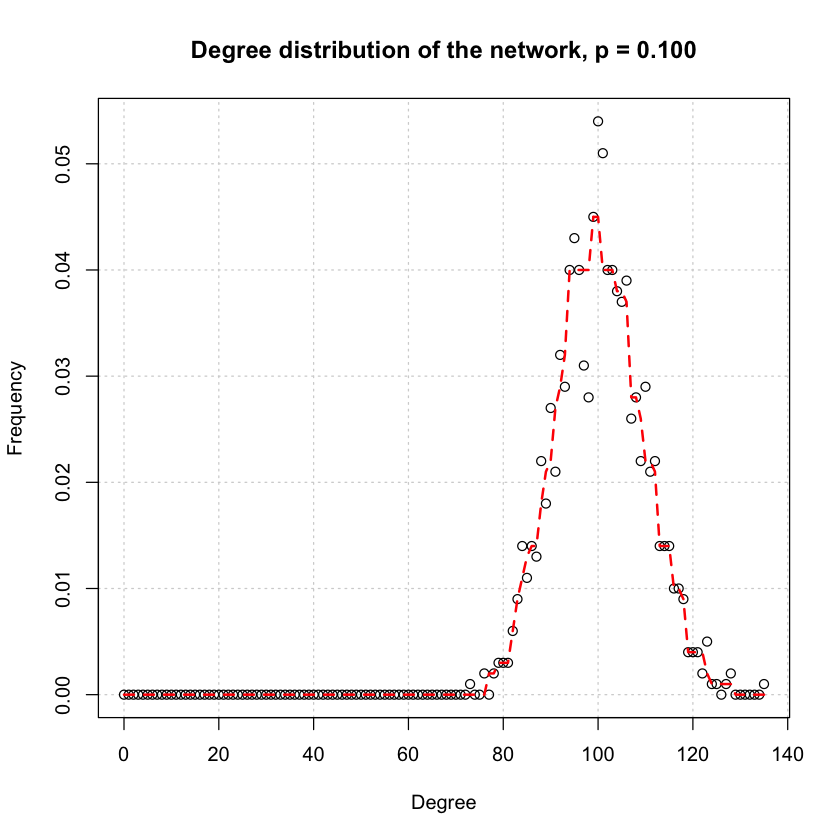

In [2]:
pList <- c(0.003, 0.004, 0.01, 0.05, 0.1)
i = 1
for (p in pList) {
    g <- sample_gnp(1000,p,directed = FALSE)
    plot(seq_along(degree.distribution(g)) - 1, degree.distribution(g),
         main=sprintf("Degree distribution of the network, p = %0.3f",p),xlab="Degree",ylab="Frequency",grid())
    lines(seq_along(degree.distribution(g)) - 1, smooth(degree.distribution(g),kind = '3RS3R'),lwd = 2,col='red',lty=2)
    dev.copy2eps(file=sprintf('Q1a%d.eps',i))
    print(sprintf("p=%.3f: Mean=%f, Variance=%f", p, mean(degree(g)), var(degree(g))))
    i <- i+1
}

## Question 1b

In [3]:
for (p in pList) {
    gccflag = 1
    count = 0
    diameterGCC = -1
    GCCnode = -1
    GCCedge = -1
    for (i in 1:1000) {
        g <- sample_gnp(1000,p,directed = FALSE)
        if (is.connected(g)){
            count <- count + 1
        }
        else if (!is.connected(g)){
            if(gccflag){
                g.components <- clusters(g)
                ix <- which.max(g.components$csize)
                g.giant <- induced.subgraph(g, which(g.components$membership == ix))
                diameterGCC <- diameter(g.giant, directed = FALSE)
                GCCnode <- vcount(g.giant)
                GCCedge <- ecount(g.giant)
                gccflag = 0
            }
        }
    }
    print(sprintf("Probability of connectedness for p = %0.3f: %f", p, count/1000))
    print(sprintf("Diameter of GCC for a random non-connected network: %d (-1 means no non-connected network exists)", diameterGCC))
    print(sprintf("Number of nodes of GCC for a random non-connected network: %d (-1 means no non-connected network exists)", GCCnode))
    print(sprintf("Number of edges of GCC for a random non-connected network: %d (-1 means no non-connected network exists)", GCCedge))
    print("-----------------------------------------------------------------------------------------------------------------------------")
}

[1] "Probability of connectedness for p = 0.003: 0.000000"
[1] "Diameter of GCC for a random non-connected network: 13 (-1 means no non-connected network exists)"
[1] "Number of nodes of GCC for a random non-connected network: 949 (-1 means no non-connected network exists)"
[1] "Number of edges of GCC for a random non-connected network: 1570 (-1 means no non-connected network exists)"
[1] "-----------------------------------------------------------------------------------------------------------------------------"
[1] "Probability of connectedness for p = 0.004: 0.000000"
[1] "Diameter of GCC for a random non-connected network: 11 (-1 means no non-connected network exists)"
[1] "Number of nodes of GCC for a random non-connected network: 977 (-1 means no non-connected network exists)"
[1] "Number of edges of GCC for a random non-connected network: 2052 (-1 means no non-connected network exists)"
[1] "---------------------------------------------------------------------------------------

## Question 1c

pdf 
  2

[1] "p at which GCC starts to emerge: 0.001100"
[1] "p at which 99 percent nodes belong to GCC: 0.007300"


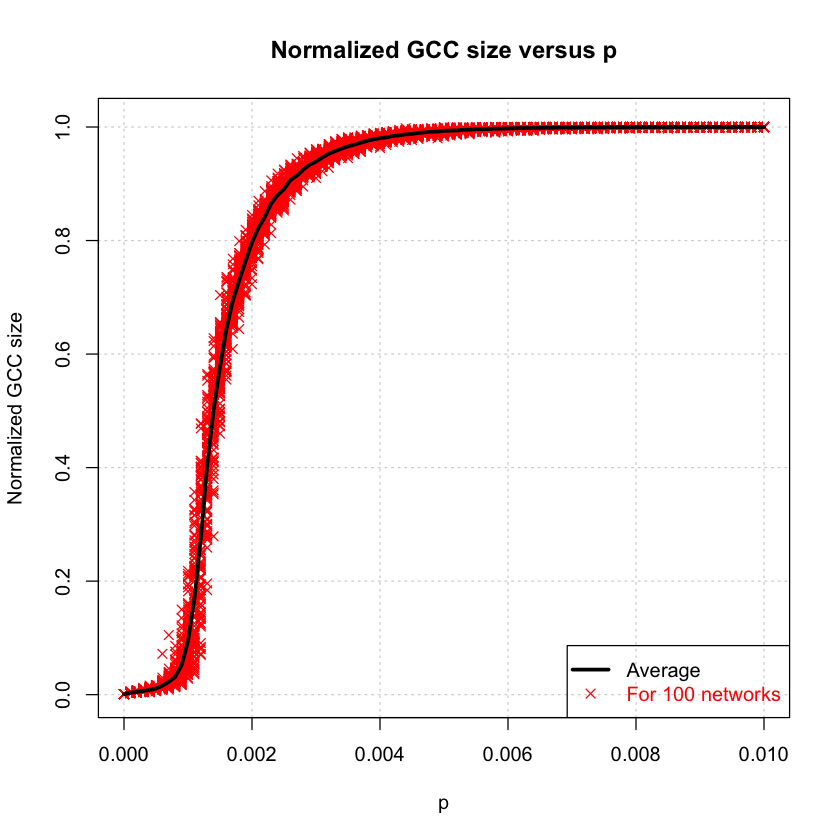

In [9]:
pList <- seq(0,0.01,0.0001)
m = matrix(data = 0.0, nrow = 100, ncol = length(pList))
v = matrix(data= 0.0, nrow=length(pList),ncol=1)
j = 1
for (p in pList){
    for (i in 1:100){
    g <- sample_gnp(1000,p,directed = FALSE)
    g.components <- clusters(g)
    m[i,j] <- max(g.components$csize)/1000   
    }
    v[j] = mean(m[,j])
    j <- j+1
}
plot(rep(pList[1],100),m[1:100,1],xlim = c(0,0.01), ylim = c(0,1.01),xlab="p",main = "Normalized GCC size versus p",ylab="Normalized GCC size",grid(),pch=4,col='red')
j = 2
for (p in pList[2:length(pList)]){
    points(rep(p,100),m[1:100,j],pch=4,col='red')
    j <- j+1
}
lines(pList,v,lwd=3)
legend('bottomright', legend = c("Average", "For 100 networks"),
       pch = c(NA, 4), lty = c(1, NA), lwd = c(3,NA),
       col = c(1,'red'), text.col = c(1,'red'))
dev.copy2eps(file='Q1c.eps')
print(sprintf("p at which GCC starts to emerge: %f",pList[min(which(v>0.1))]))
print(sprintf("p at which 99 percent nodes belong to GCC: %f",pList[mean(which(v>0.99))]))

## Question 1d

pdf 
  2

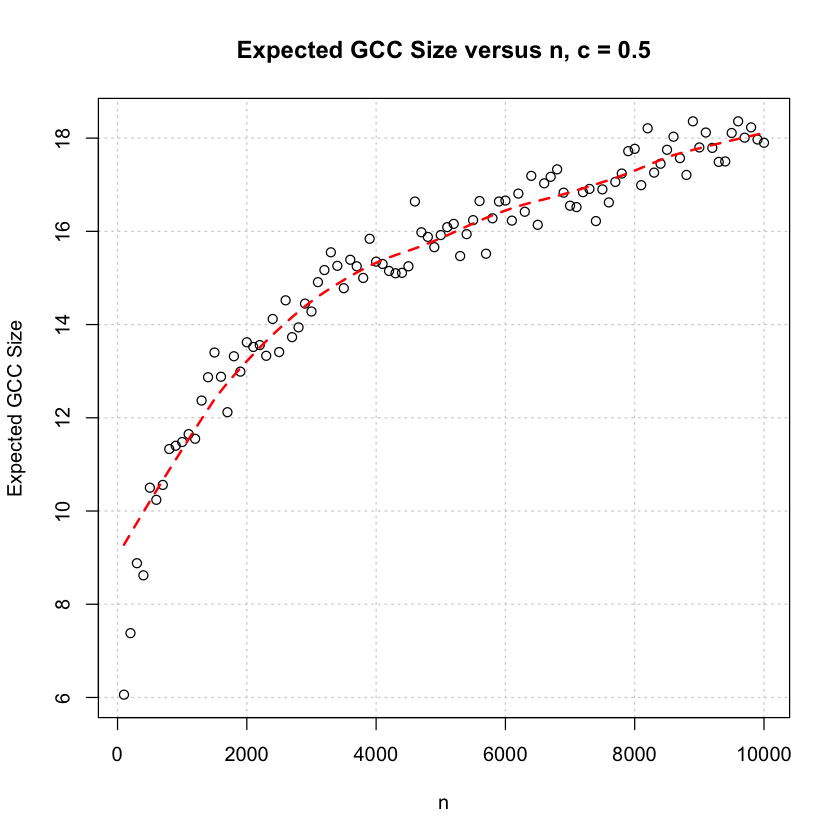

In [5]:
nList <- seq(100,10000,100)
q = matrix(data = 0.0, nrow = 100, ncol = length(nList))
r = matrix(data= 0.0, nrow=length(nList),ncol=1)
c = 0.5
j = 1
for (n in nList){
    for (i in 1:100){
    g <- sample_gnp(n,c/n,directed = FALSE)
    g.components <- clusters(g)
    q[i,j] <- max(g.components$csize)  
    }
    r[j] <- mean(q[,j])
    j <- j+1
}
plot(nList,r,xlab="n",main = "Expected GCC Size versus n, c = 0.5",ylab="Expected GCC Size",grid())
lines(lowess(nList,r,f = 0.3), col="red",lwd = 2,lty=2)
dev.copy2eps(file='Q1da.eps')

pdf 
  2

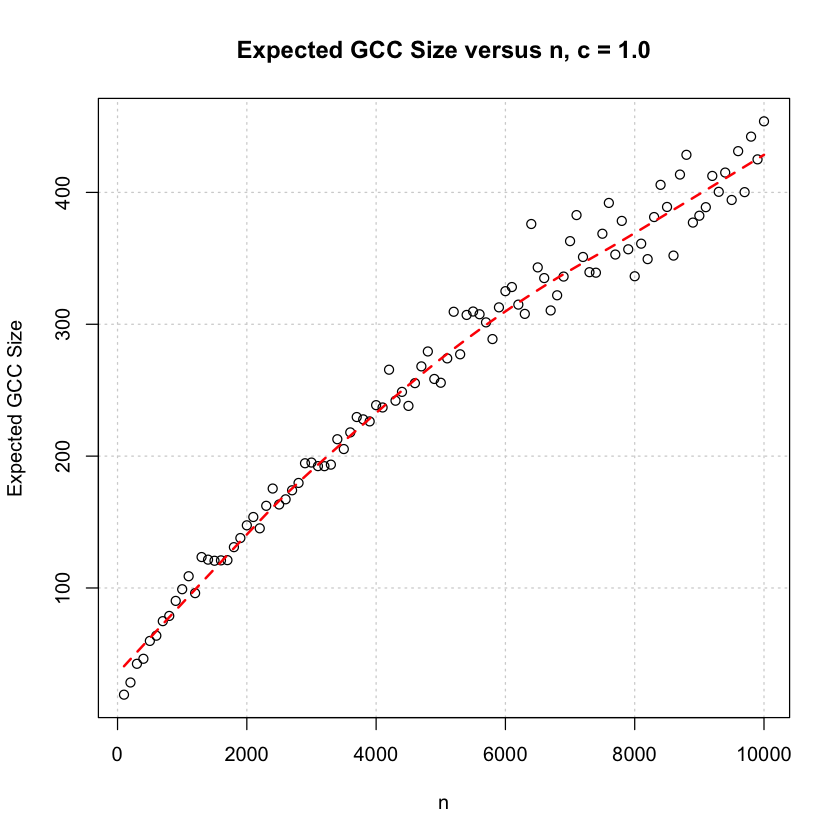

In [6]:
nList <- seq(100,10000,100)
q = matrix(data = 0.0, nrow = 100, ncol = length(nList))
r = matrix(data= 0.0, nrow=length(nList),ncol=1)
c = 1.0
j = 1
for (n in nList){
    for (i in 1:100){
    g <- sample_gnp(n,c/n,directed = FALSE)
    g.components <- clusters(g)
    q[i,j] <- max(g.components$csize)  
    }
    r[j] <- mean(q[,j])
    j <- j+1
}
plot(nList,r,xlab="n",main = "Expected GCC Size versus n, c = 1.0",ylab="Expected GCC Size",grid())
lines(lowess(nList,r,f = 0.5), col="red",lwd = 2,lty=2)
dev.copy2eps(file='Q1db.eps')

pdf 
  2

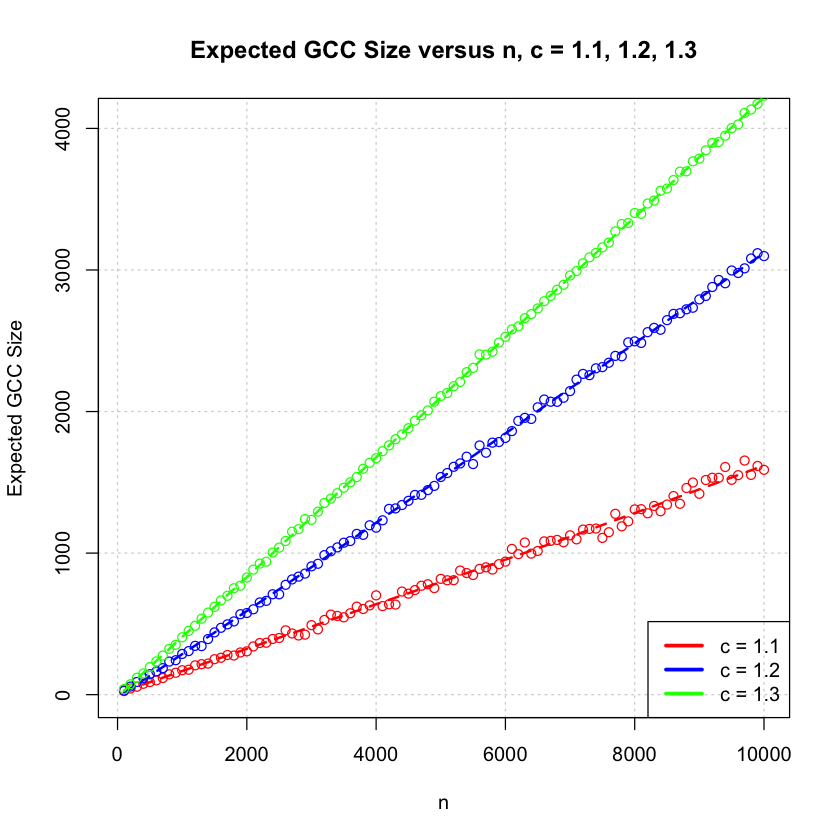

In [7]:
nList <- seq(100,10000,100)
q = matrix(data = 0.0, nrow = 100, ncol = length(nList))
r = matrix(data= 0.0, nrow=length(nList),ncol=1)
c = 1.1
j = 1
for (n in nList){
    for (i in 1:100){
    g <- sample_gnp(n,c/n,directed = FALSE)
    g.components <- clusters(g)
    q[i,j] <- max(g.components$csize)  
    }
    r[j] <- mean(q[,j])
    j <- j+1
}
plot(nList,r,xlab="n",main = "Expected GCC Size versus n, c = 1.1, 1.2, 1.3",ylab="Expected GCC Size",grid(),col="red",ylim = c(0,4050))
lines(lowess(nList,r,f = 0.5), col="red",lwd = 2,lty=2)

q = matrix(data = 0.0, nrow = 100, ncol = length(nList))
r = matrix(data= 0.0, nrow=length(nList),ncol=1)
c = 1.2
j = 1
for (n in nList){
    for (i in 1:100){
    g <- sample_gnp(n,c/n,directed = FALSE)
    g.components <- clusters(g)
    q[i,j] <- max(g.components$csize)  
    }
    r[j] = mean(q[,j])
    j <- j+1
}
points(nList,r,xlab="n",col="blue")
lines(lowess(nList,r,f = 0.5), col="blue",lwd = 2,lty=2)

q = matrix(data = 0.0, nrow = 100, ncol = length(nList))
r = matrix(data= 0.0, nrow=length(nList),ncol=1)
c = 1.3
j = 1
for (n in nList){
    for (i in 1:100){
    g <- sample_gnp(n,c/n,directed = FALSE)
    g.components <- clusters(g)
    q[i,j] <- max(g.components$csize)  
    }
    r[j] = mean(q[,j])
    j <- j+1
}
points(nList,r,xlab="n",col="green")
lines(lowess(nList,r,f = 0.5), col="green",lwd = 2,lty=2)
legend('bottomright', legend = c("c = 1.1", "c = 1.2", "c = 1.3"),
       lty = c(1, 1, 1), lwd = c(3,3,3),
       col = c('red','blue','green'))
dev.copy2eps(file='Q1dc.eps')

## Question 2a

[1] "Total iterations: 100, Connected graphs: 100"


pdf 
  2

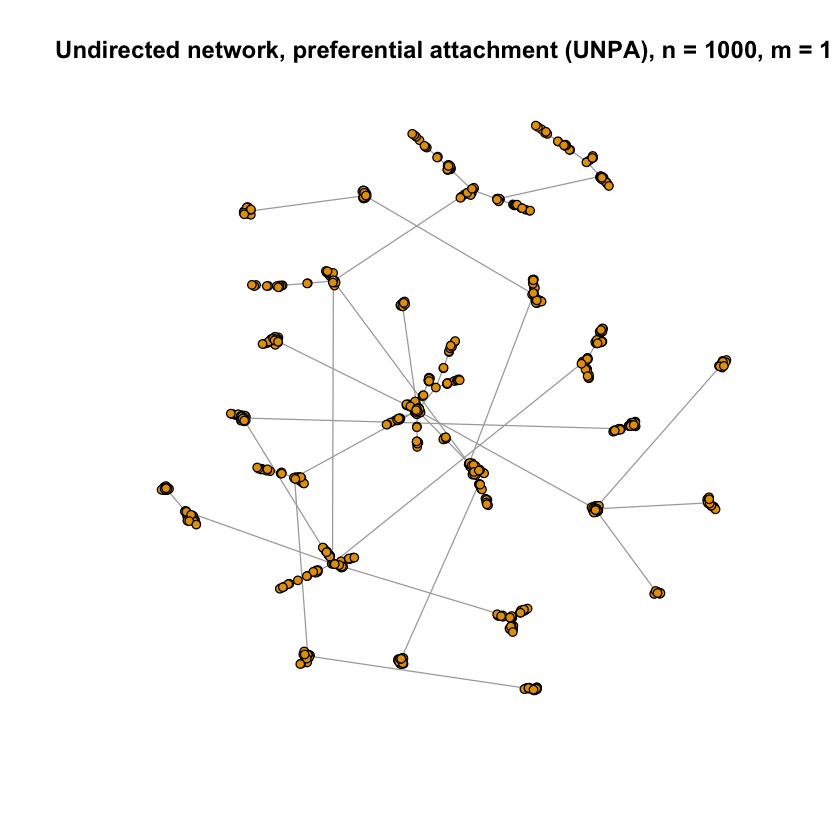

In [8]:
count = 0
for (i in 1:100) {
    g <- barabasi.game(1000, m=1, directed=FALSE)
    if (is.connected(g)) {
        count <- count + 1
    }
}
print(sprintf("Total iterations: 100, Connected graphs: %d",count))
plot(g,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 1000, m = 1")
dev.copy2eps(file='Q2a.eps')

## Question 2b

[1] "Modularity: 0.933042"


pdf 
  2

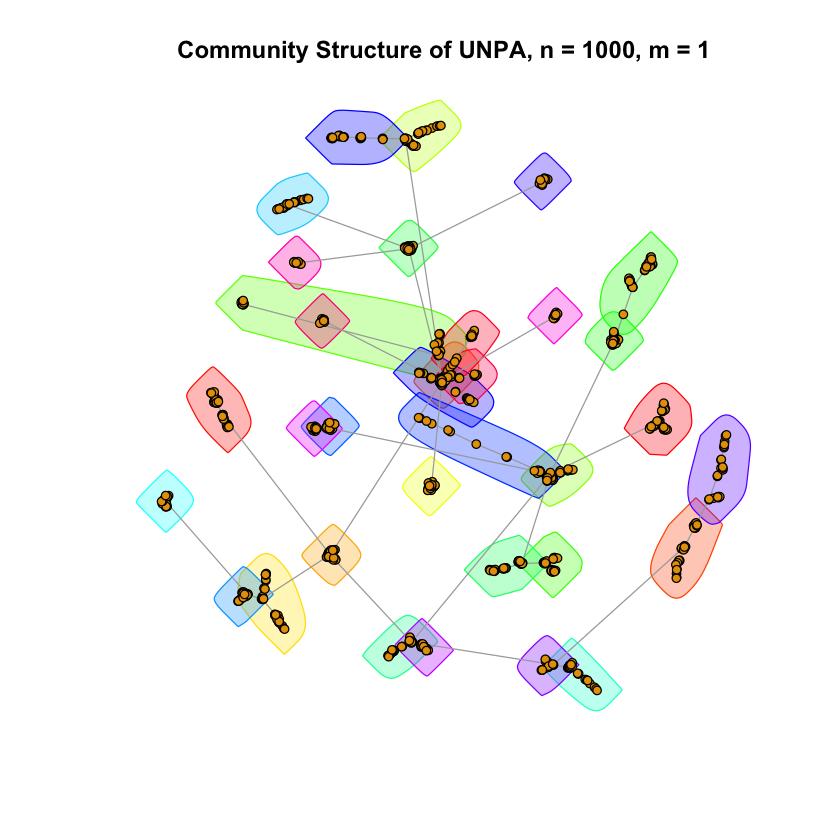

In [16]:
comm_struct <- cluster_fast_greedy(g)
mod <- modularity(comm_struct)
print(sprintf("Modularity: %f",mod))
plot(g, mark.groups = groups(comm_struct), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 1000, m = 1")
dev.copy2pdf(file='Q2ba.pdf')

pdf 
  2

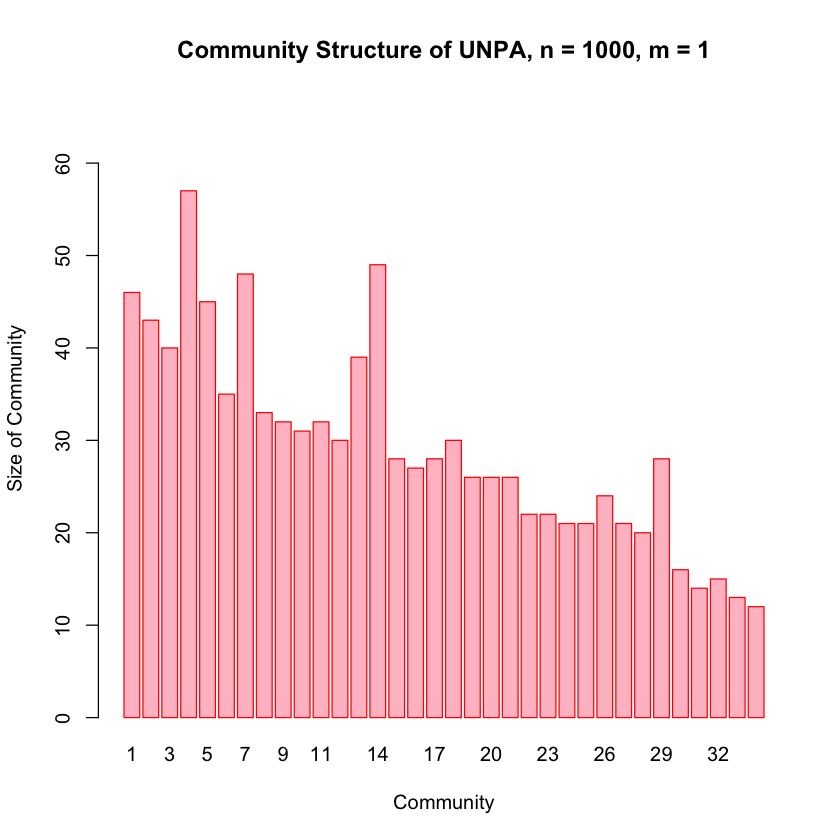

In [17]:
barplot(as.vector(sizes(comm_struct)),names.arg = seq(1,length(comm_struct),1),main="Community Structure of UNPA, n = 1000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct)))+10),border="red",col="pink")
dev.copy2eps(file='Q2bb.eps')

## Question 2c

pdf 
  2

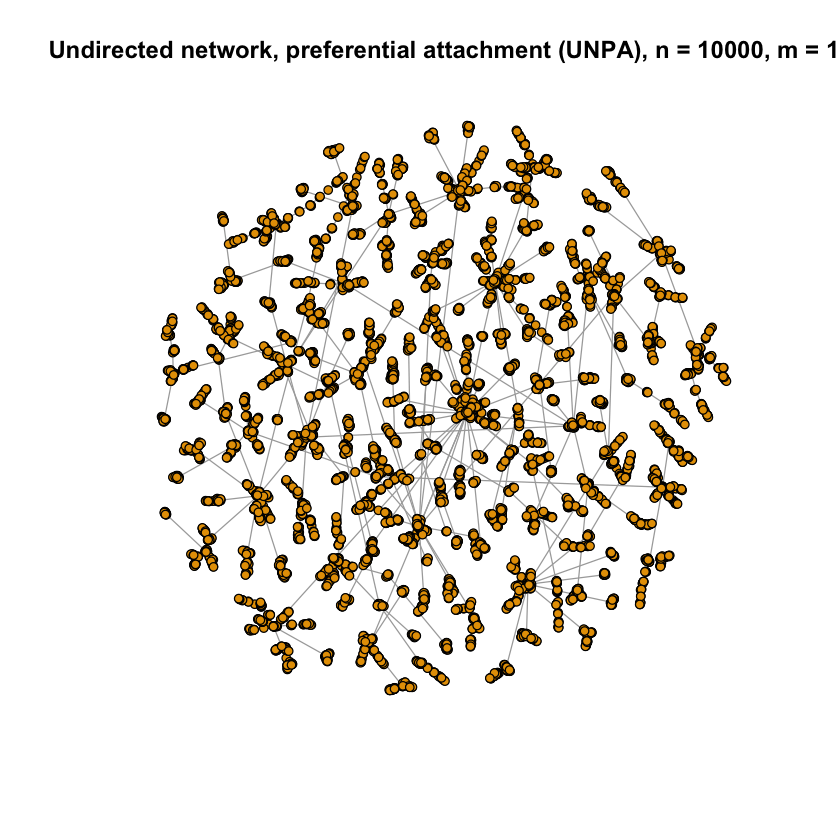

In [18]:
g2 <- barabasi.game(10000, m=1, directed=FALSE)
plot(g2,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 10000, m = 1")
dev.copy2eps(file='Q2ca.eps')

[1] "Modularity: 0.977433"


pdf 
  2

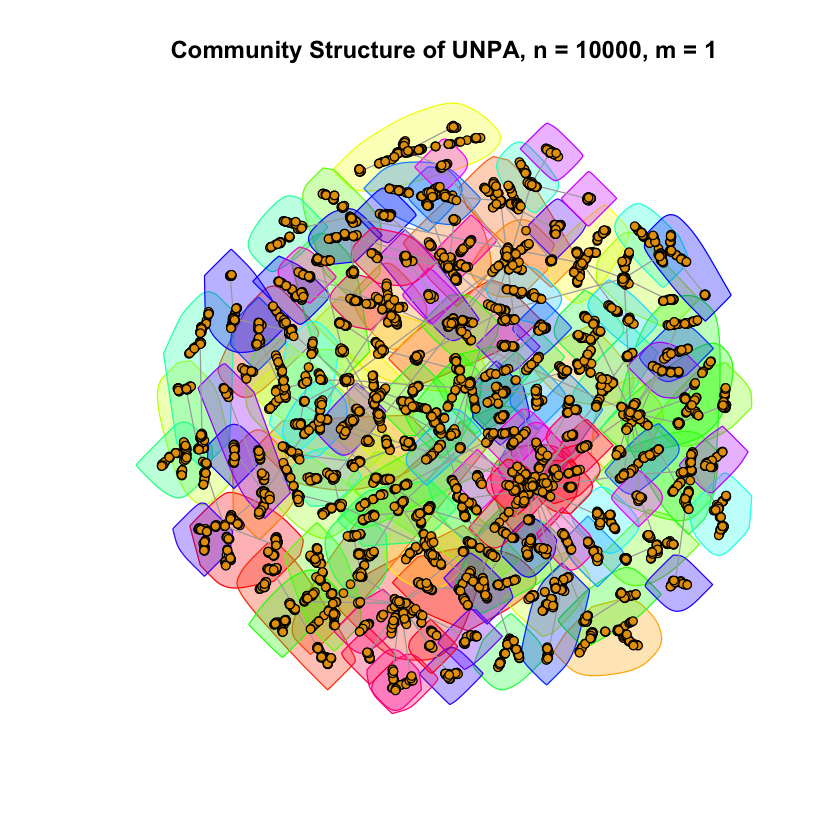

In [19]:
comm_struct2 <- cluster_fast_greedy(g2)
mod2 <- modularity(comm_struct2)
print(sprintf("Modularity: %f",mod2))
plot(g2, mark.groups = groups(comm_struct2), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 10000, m = 1")
dev.copy2pdf(file='Q2cb.pdf')

pdf 
  2

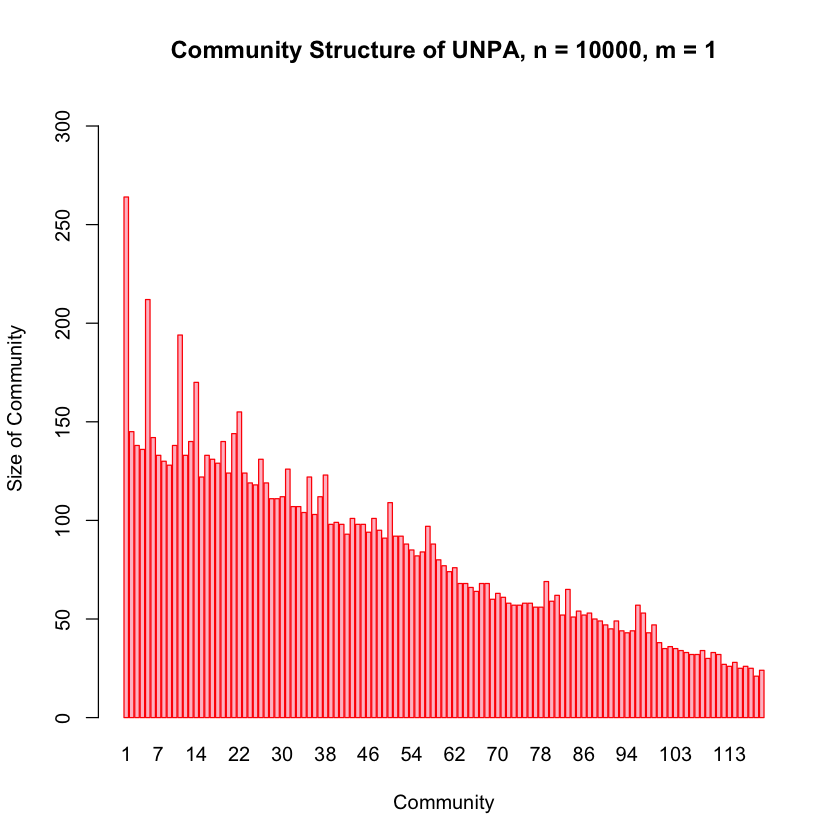

In [20]:
barplot(as.vector(sizes(comm_struct2)),names.arg = seq(1,length(comm_struct2),1),main="Community Structure of UNPA, n = 10000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct2)))+50),border="red",col="pink")
dev.copy2eps(file='Q2cc.eps')

## Question 2d

pdf 
  2

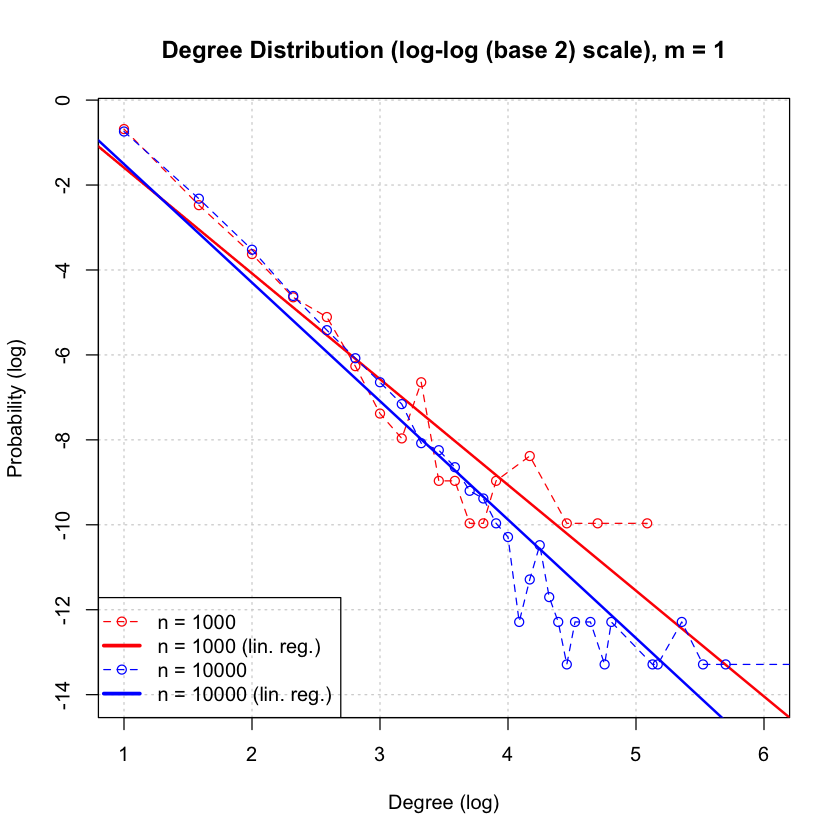

In [21]:
deg_dist_1 = degree.distribution(g)
deg_1 <- log2(c(1:length(deg_dist_1)))[which(deg_dist_1 !=0, arr.ind = TRUE)]
dist_1 <- log2(deg_dist_1)[which(deg_dist_1 !=0, arr.ind = TRUE)]
plot(deg_1,dist_1,main="Degree Distribution (log-log (base 2) scale), m = 1",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",ylim=c(-14,-0.5),xlim=c(1,6))
lines(deg_1,dist_1,lty=2,col="red")
abline(lm(dist_1 ~ deg_1),col="red",lwd=2)

deg_dist_2 = degree.distribution(g2)
deg_2 <- log2(c(1:length(deg_dist_2)))[which(deg_dist_2 !=0, arr.ind = TRUE)]
dist_2 <- log2(deg_dist_2)[which(deg_dist_2 !=0, arr.ind = TRUE)]
points(deg_2,dist_2,col="blue")
lines(deg_2,dist_2,lty=2,col="blue")
abline(lm(dist_2 ~ deg_2),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n = 1000 (lin. reg.)","n = 10000", "n = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2da.eps')

In [22]:
print("Slope and intercept for n = 1000:")
print(lm(dist_1 ~ deg_1))
print("Slope and intercept for n = 10000:")
print(lm(dist_2 ~ deg_2))

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_1 ~ deg_1)

Coefficients:
(Intercept)        deg_1  
     0.9011      -2.4906  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_2 ~ deg_2)

Coefficients:
(Intercept)        deg_2  
      1.283       -2.790  



## Question 2e

In [23]:
deg_n = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    i_n = sample(1000,1)
    i_j = neighbors(g,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n[i] = degree(g,i_j)    
}
dist_n = table(deg_n)
dist_n_1000 = log2(as.vector(dist_n)/1000)
deg_n_1000 = log2(as.numeric(names(dist_n)))

deg_n2 = matrix(data=0.0,nrow=10000,ncol=1)
for (i in 1:10000){
    i_n = sample(10000,1)
    i_j = neighbors(g2,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n2[i] = degree(g2,i_j)    
}
dist_n2 = table(deg_n2)
dist_n_10000 = log2(as.vector(dist_n2)/10000)
deg_n_10000 = log2(as.numeric(names(dist_n2)))

pdf 
  2

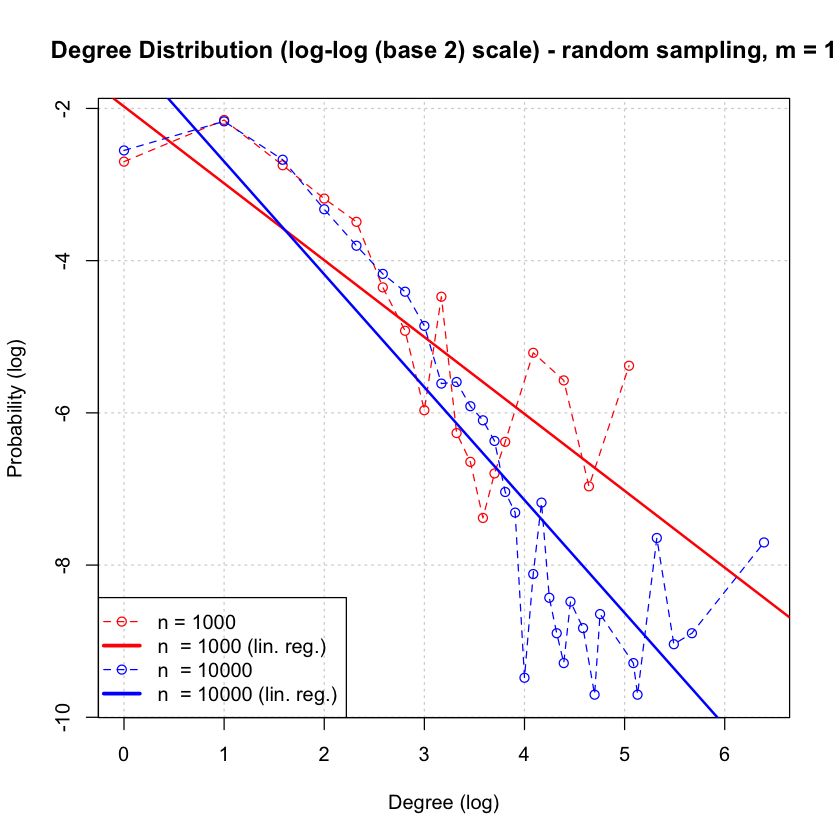

In [24]:
plot(deg_n_1000,dist_n_1000,main="Degree Distribution (log-log (base 2) scale) - random sampling, m = 1",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",xlim=c(0,max(deg_n_10000)),ylim=c(min(dist_n_10000),max(dist_n_10000)))
lines(deg_n_1000,dist_n_1000,lty=2,col="red")
abline(lm(dist_n_1000 ~ deg_n_1000),col="red",lwd=2)
points(deg_n_10000,dist_n_10000,col="blue")
lines(deg_n_10000,dist_n_10000,lty=2,col="blue")
abline(lm(dist_n_10000 ~ deg_n_10000),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n  = 1000 (lin. reg.)","n  = 10000", "n  = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2e.eps')

In [25]:
print("Slope and intercept for n = 1000:")
print(lm(dist_n_1000 ~ deg_n_1000))
print("Slope and intercept for n = 10000:")
print(lm(dist_n_10000 ~ deg_n_10000))

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_n_1000 ~ deg_n_1000)

Coefficients:
(Intercept)   deg_n_1000  
     -1.974       -1.010  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_n_10000 ~ deg_n_10000)

Coefficients:
(Intercept)  deg_n_10000  
     -1.215       -1.483  



## Question 2f

pdf 
  2

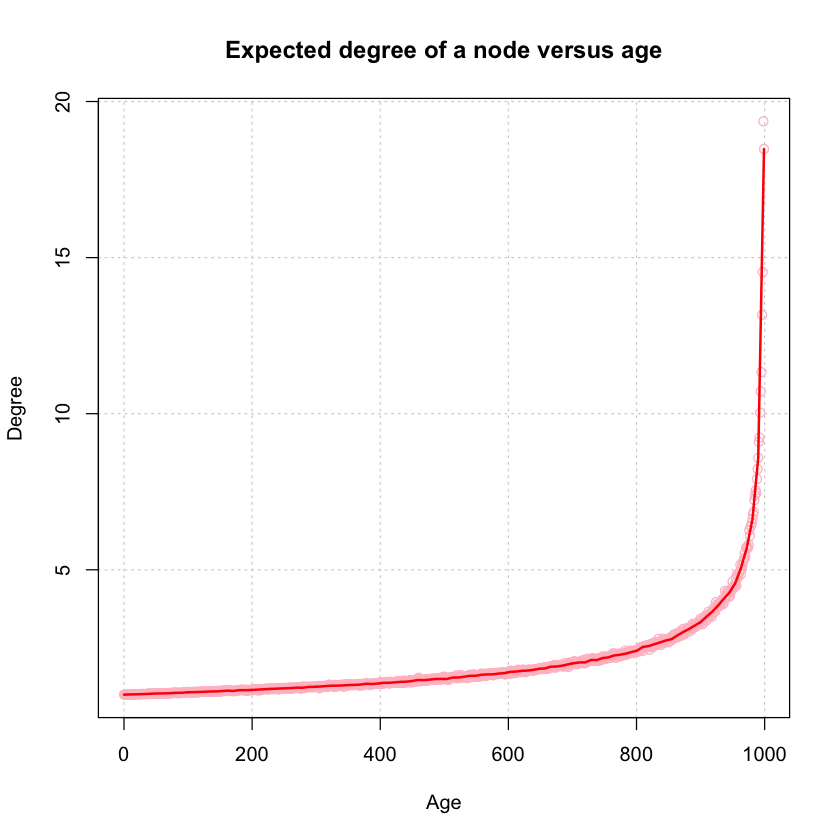

In [26]:
deg_age = matrix(data=0.0,nrow = 1000,ncol=1)
for (i in 1:1000) {
    g <- barabasi.game(1000, m=1, directed=FALSE)
    deg_age = deg_age+degree(g)
}
deg_age = deg_age/1000
plot(seq(999,0,-1),deg_age,col='pink',ylab="Degree",xlab="Age",main="Expected degree of a node versus age",grid())
lines(lowess(seq(999,0,-1),deg_age,f = 0.01), col="red",lwd = 2)
dev.copy2eps(file='Q2f.eps')

## Question 2g

[1] "Total iterations: 100, Connected graphs: 100"


pdf 
  2

[1] "Total iterations: 100, Connected graphs: 100"


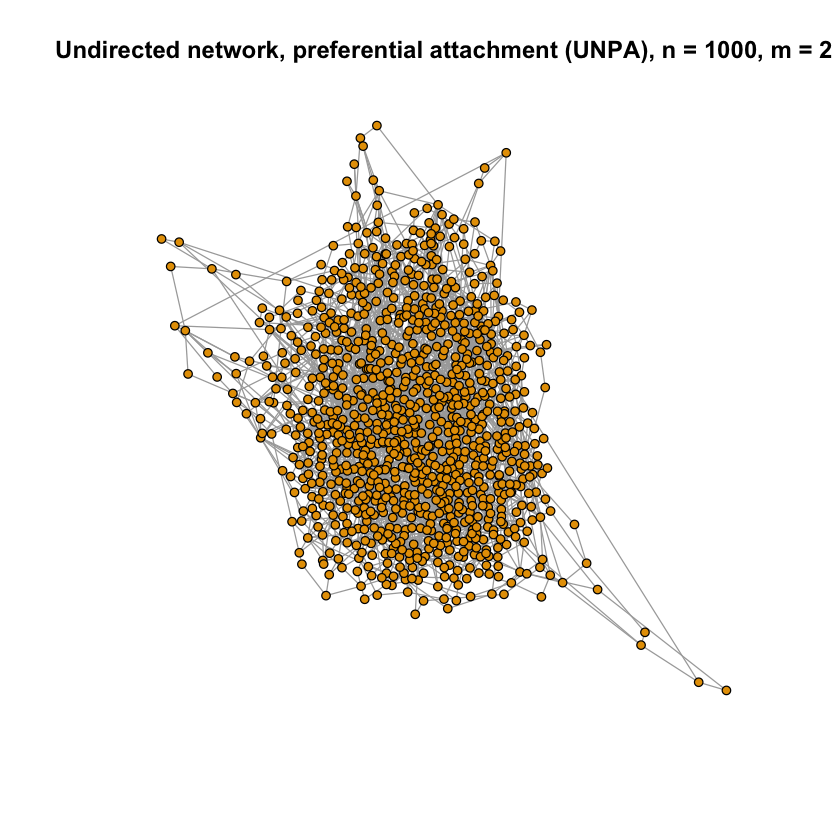

pdf 
  2

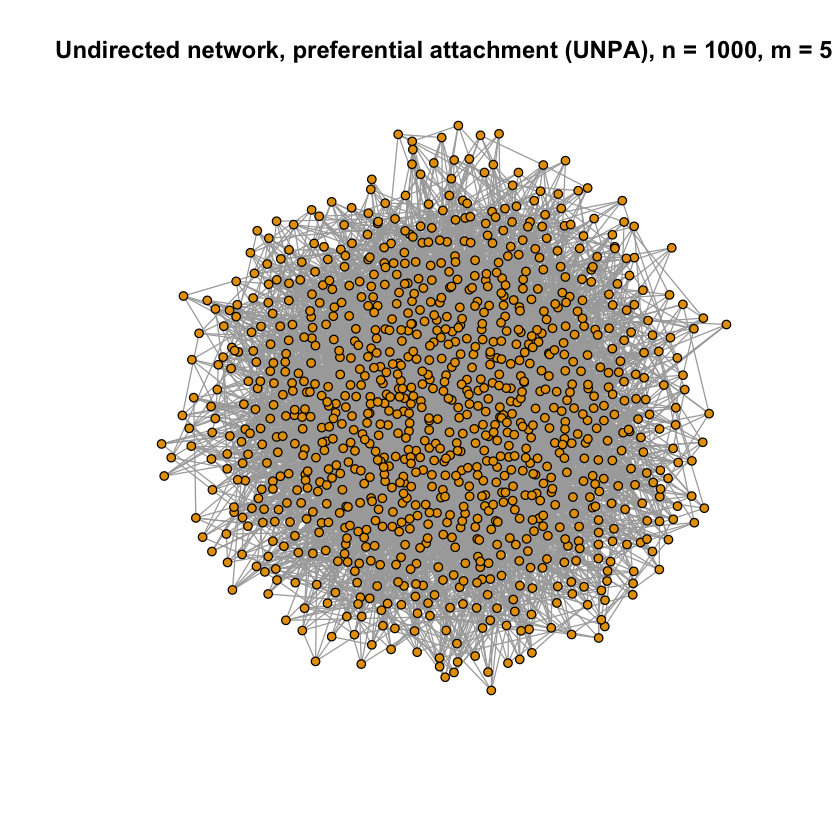

In [27]:
count = 0
for (i in 1:100) {
    g <- barabasi.game(1000, m=2, directed=FALSE)
    if (is.connected(g)) {
        count <- count + 1
    }
}
print(sprintf("Total iterations: 100, Connected graphs: %d",count))
plot(g,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 1000, m = 2")
dev.copy2eps(file='Q2ga.eps')

count = 0
for (i in 1:100) {
    g2 <- barabasi.game(1000, m=5, directed=FALSE)
    if (is.connected(g2)) {
        count <- count + 1
    }
}
print(sprintf("Total iterations: 100, Connected graphs: %d",count))
plot(g2,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 1000, m = 5")
dev.copy2eps(file='Q2gb.eps')

[1] "Modularity: 0.520994"


pdf 
  2

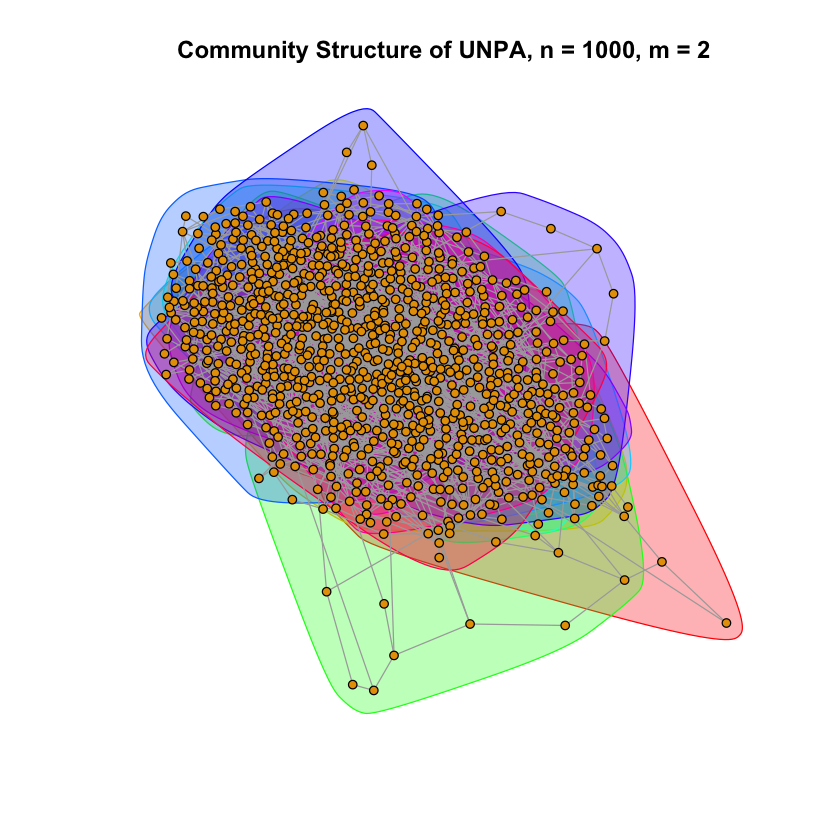

pdf 
  2

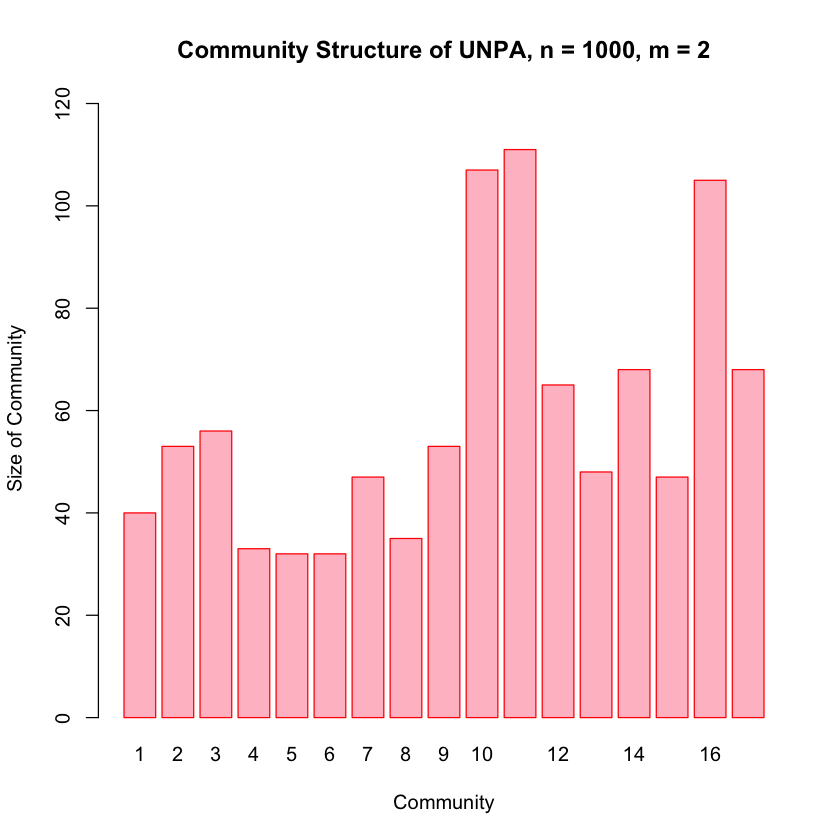

In [28]:
comm_struct <- cluster_fast_greedy(g)
mod <- modularity(comm_struct)
print(sprintf("Modularity: %f",mod))
plot(g, mark.groups = groups(comm_struct), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 1000, m = 2")
dev.copy2pdf(file='Q2gc.pdf')
barplot(as.vector(sizes(comm_struct)),names.arg = seq(1,length(comm_struct),1),main="Community Structure of UNPA, n = 1000, m = 2",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct)))+10),border="red",col="pink")
dev.copy2eps(file='Q2gd.eps')

[1] "Modularity: 0.277776"


pdf 
  2

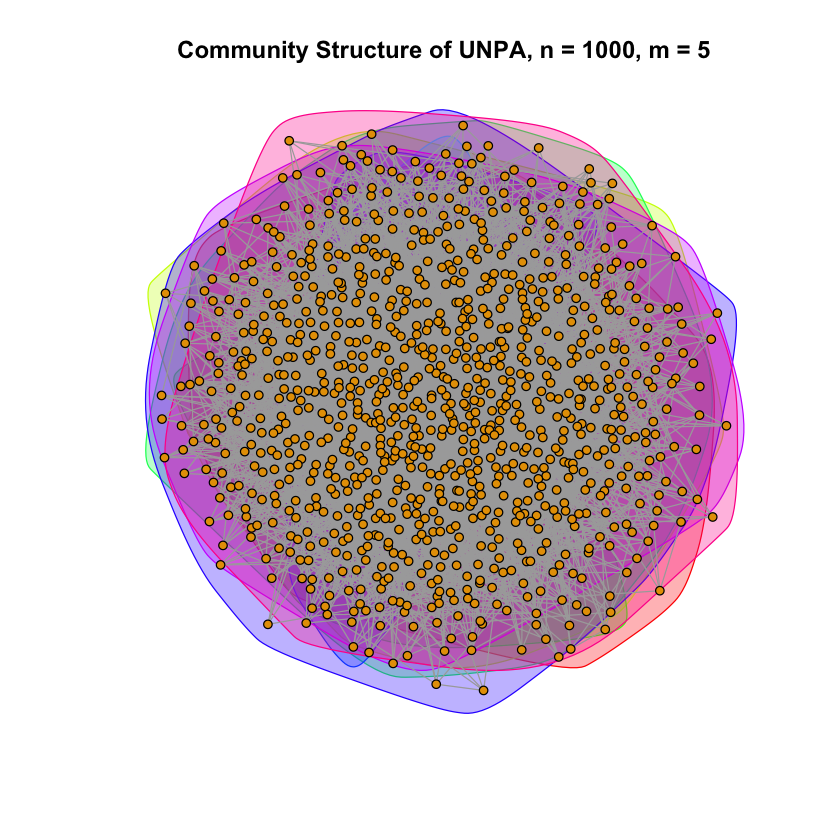

pdf 
  2

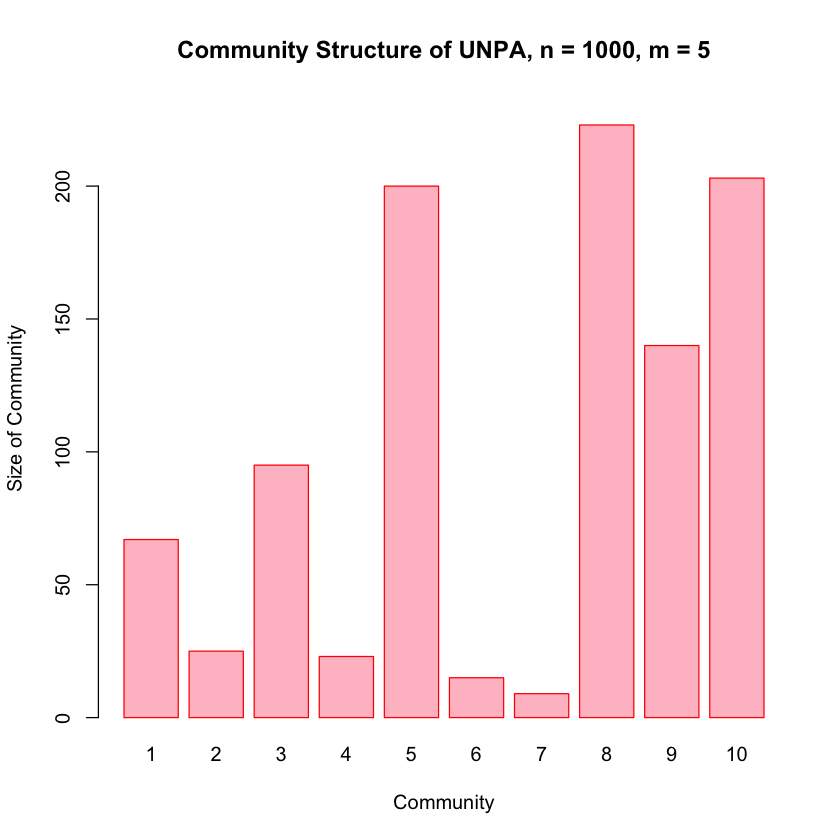

In [29]:
comm_struct <- cluster_fast_greedy(g2)
mod <- modularity(comm_struct)
print(sprintf("Modularity: %f",mod))
plot(g2, mark.groups = groups(comm_struct), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 1000, m = 5")
dev.copy2pdf(file='Q2ge.pdf')
barplot(as.vector(sizes(comm_struct)),names.arg = seq(1,length(comm_struct),1),main="Community Structure of UNPA, n = 1000, m = 5",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct)))+10),border="red",col="pink")
dev.copy2eps(file='Q2gf.eps')

pdf 
  2

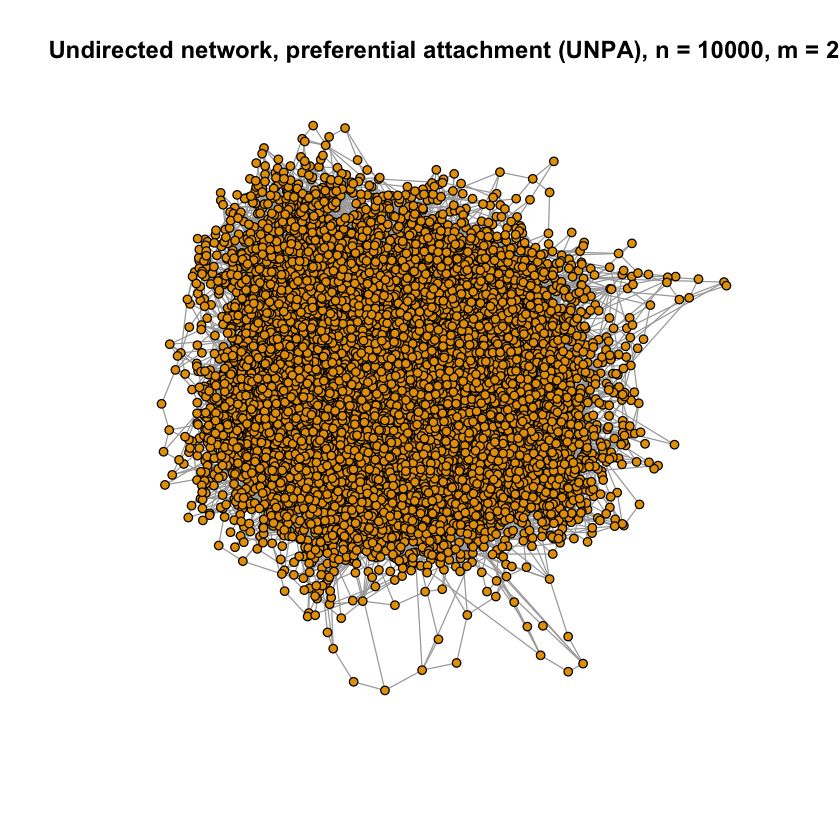

pdf 
  2

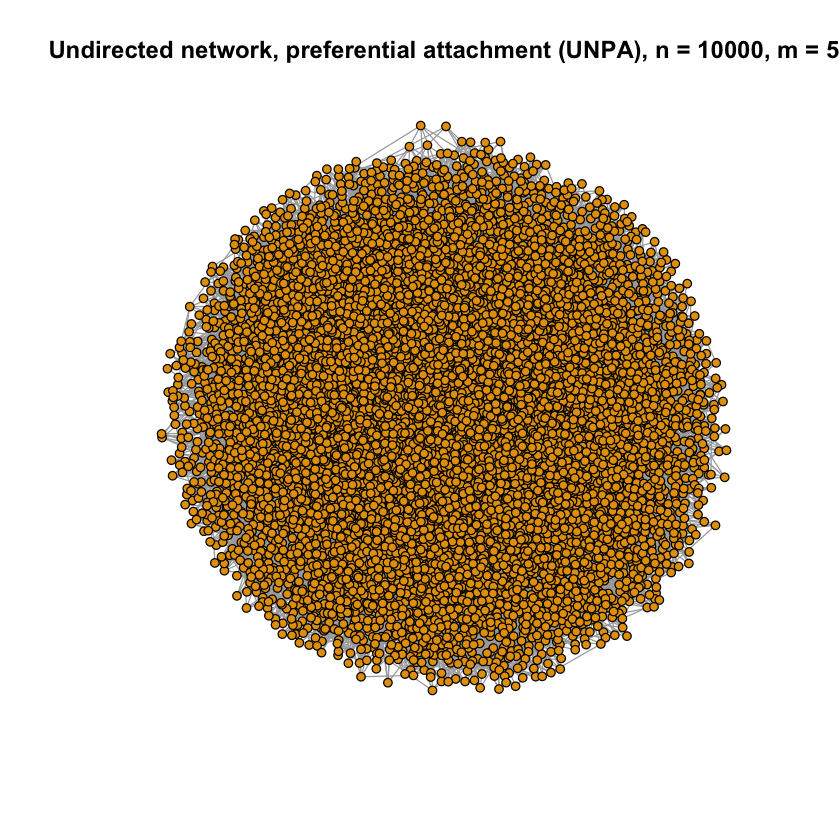

In [30]:
g3 <- barabasi.game(10000, m=2, directed=FALSE)
plot(g3,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 10000, m = 2")
dev.copy2eps(file='Q2gg.eps')

g4 <- barabasi.game(10000, m=5, directed=FALSE)
plot(g4,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 10000, m = 5")
dev.copy2eps(file='Q2gh.eps')

[1] "Modularity: 0.533746"


pdf 
  2

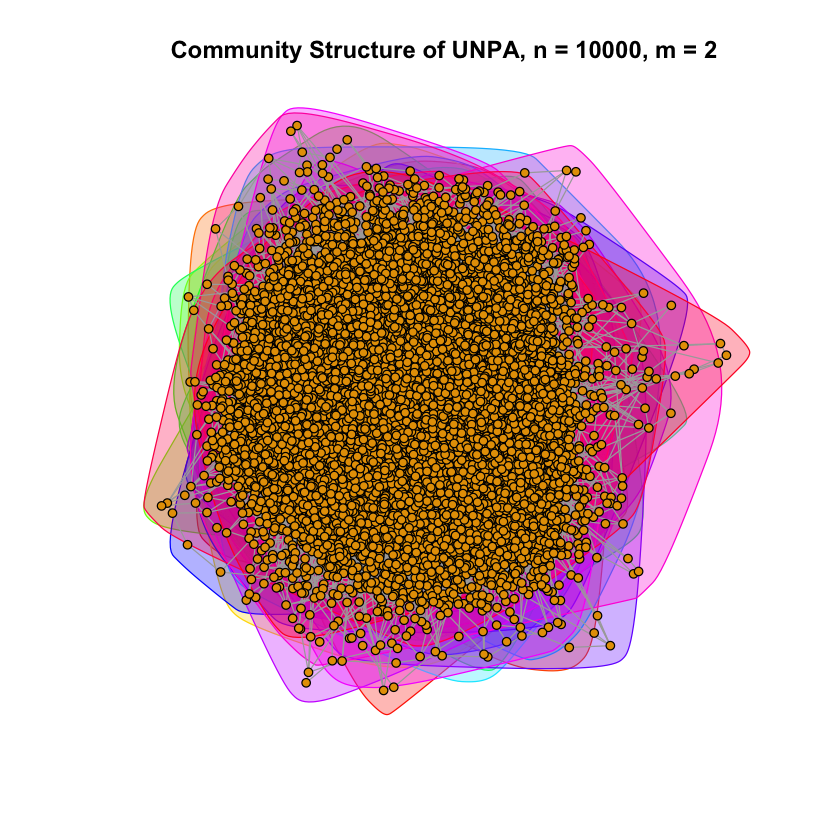

pdf 
  2

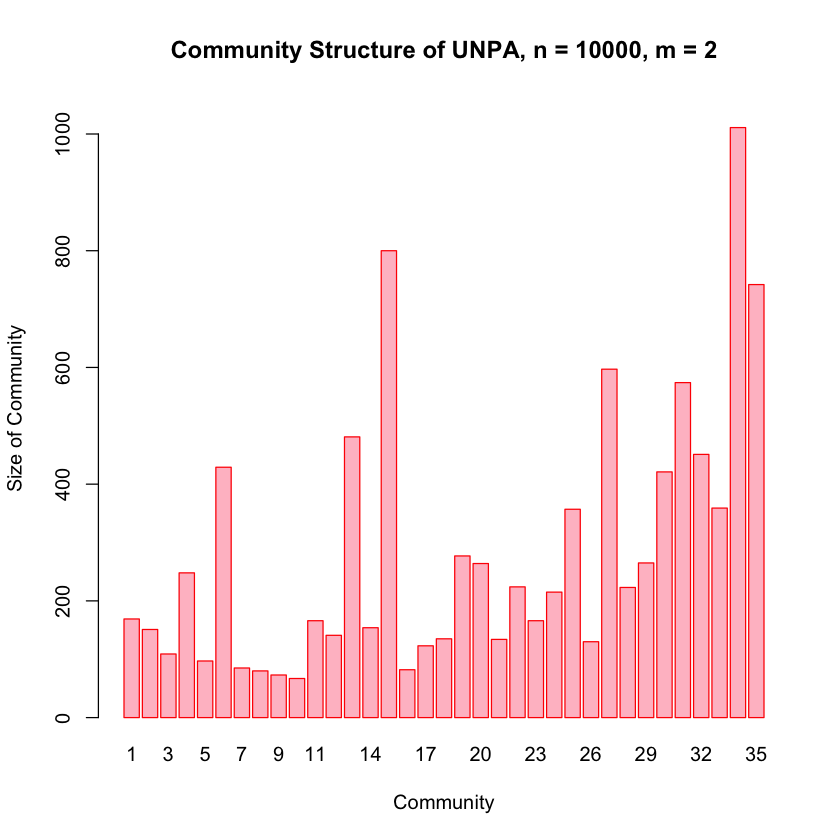

In [31]:
comm_struct3 <- cluster_fast_greedy(g3)
mod3 <- modularity(comm_struct3)
print(sprintf("Modularity: %f",mod3))
plot(g3, mark.groups = groups(comm_struct3), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 10000, m = 2")
dev.copy2pdf(file='Q2gi.pdf')

barplot(as.vector(sizes(comm_struct3)),names.arg = seq(1,length(comm_struct3),1),main="Community Structure of UNPA, n = 10000, m = 2",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct3)))+50),border="red",col="pink")
dev.copy2eps(file='Q2gj.eps')

[1] "Modularity: 0.271406"


pdf 
  2

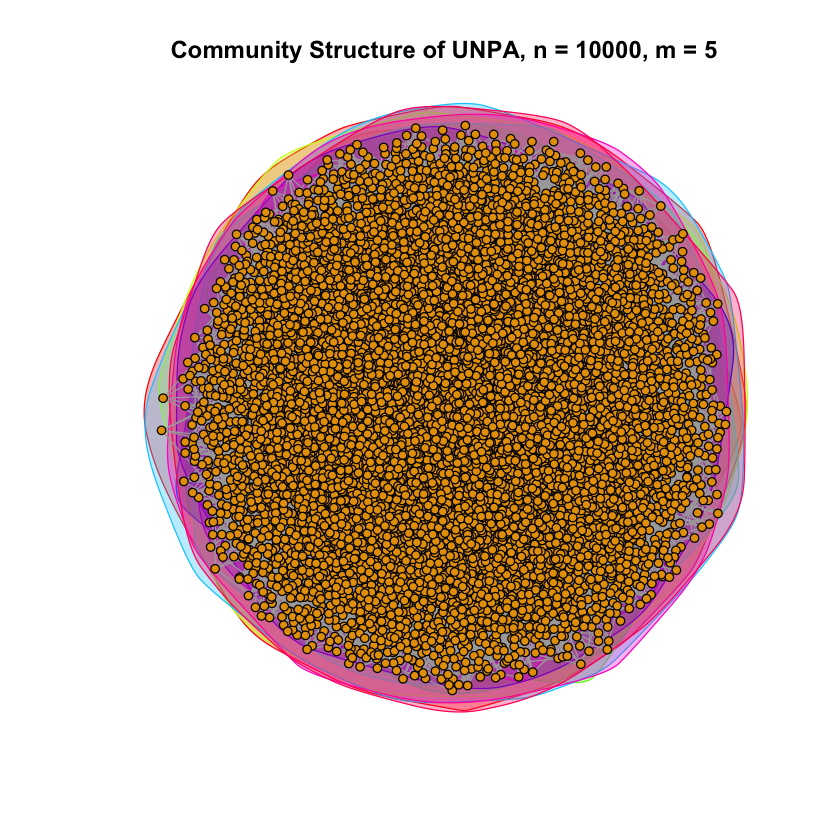

pdf 
  2

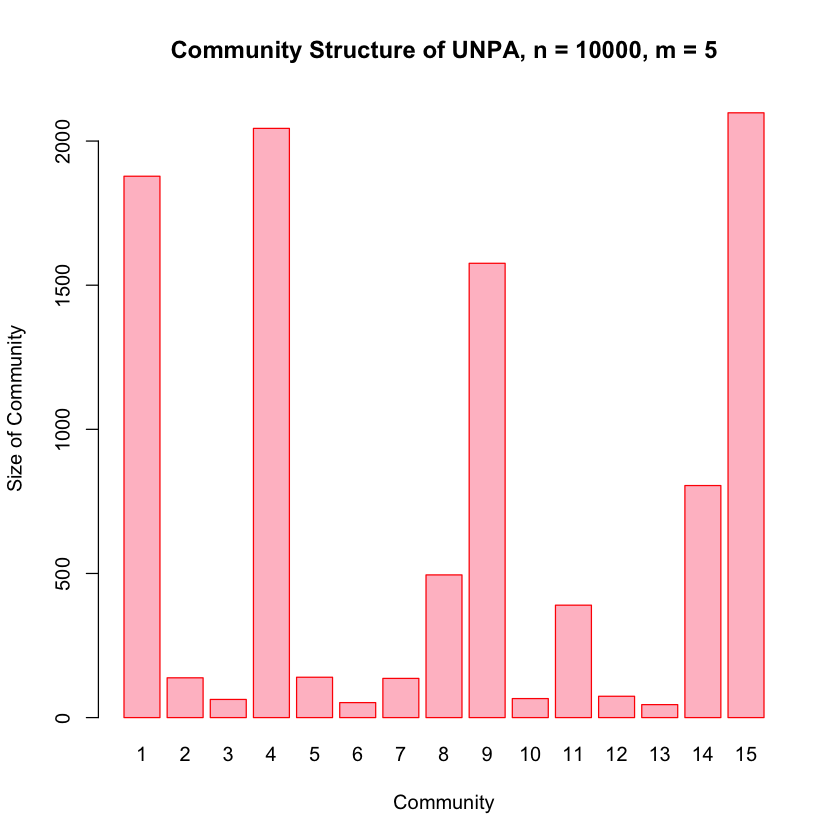

In [32]:
comm_struct4 <- cluster_fast_greedy(g4)
mod4 <- modularity(comm_struct4)
print(sprintf("Modularity: %f",mod4))
plot(g4, mark.groups = groups(comm_struct4), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 10000, m = 5")
dev.copy2pdf(file='Q2gk.pdf')

barplot(as.vector(sizes(comm_struct4)),names.arg = seq(1,length(comm_struct4),1),main="Community Structure of UNPA, n = 10000, m = 5",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct4)))+50),border="red",col="pink")
dev.copy2eps(file='Q2gl.eps')

pdf 
  2

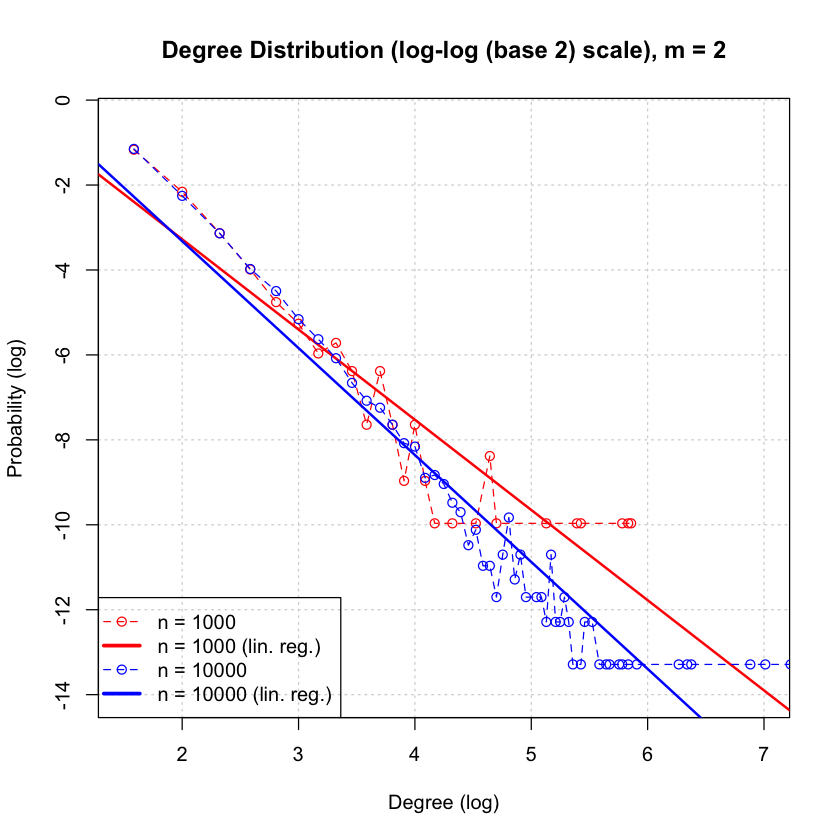

In [33]:
deg_dist_1 = degree.distribution(g)
deg_1 <- log2(c(1:length(deg_dist_1)))[which(deg_dist_1 !=0, arr.ind = TRUE)]
dist_1 <- log2(deg_dist_1)[which(deg_dist_1 !=0, arr.ind = TRUE)]
plot(deg_1,dist_1,main="Degree Distribution (log-log (base 2) scale), m = 2",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",ylim=c(-14,-0.5),xlim=c(1.5,7))
lines(deg_1,dist_1,lty=2,col="red")
abline(lm(dist_1 ~ deg_1),col="red",lwd=2)

deg_dist_2 = degree.distribution(g3)
deg_2 <- log2(c(1:length(deg_dist_2)))[which(deg_dist_2 !=0, arr.ind = TRUE)]
dist_2 <- log2(deg_dist_2)[which(deg_dist_2 !=0, arr.ind = TRUE)]
points(deg_2,dist_2,col="blue")
lines(deg_2,dist_2,lty=2,col="blue")
abline(lm(dist_2 ~ deg_2),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n = 1000 (lin. reg.)","n = 10000", "n = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2gm.eps')

In [34]:
print("Slope and intercept for n = 1000:")
print(lm(dist_1 ~ deg_1))
print("Slope and intercept for n = 10000:")
print(lm(dist_2 ~ deg_2))

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_1 ~ deg_1)

Coefficients:
(Intercept)        deg_1  
     0.9717      -2.1246  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_2 ~ deg_2)

Coefficients:
(Intercept)        deg_2  
      1.715       -2.518  



pdf 
  2

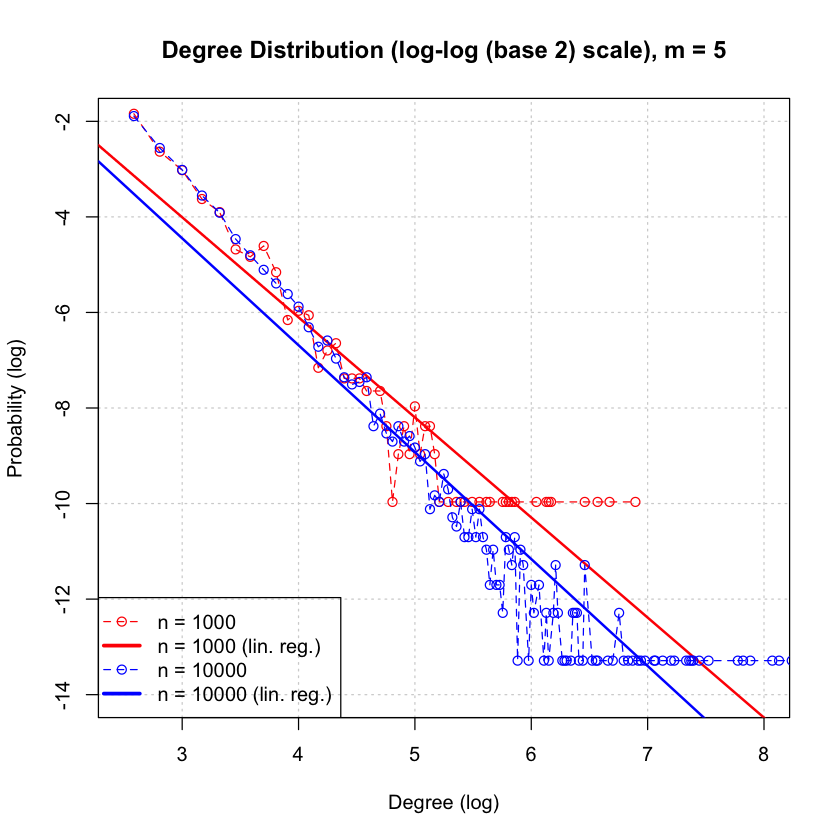

In [35]:
deg_dist_1 = degree.distribution(g2)
deg_1 <- log2(c(1:length(deg_dist_1)))[which(deg_dist_1 !=0, arr.ind = TRUE)]
dist_1 <- log2(deg_dist_1)[which(deg_dist_1 !=0, arr.ind = TRUE)]
plot(deg_1,dist_1,main="Degree Distribution (log-log (base 2) scale), m = 5",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",ylim=c(-14,-2),xlim=c(2.5,8))
lines(deg_1,dist_1,lty=2,col="red")
abline(lm(dist_1 ~ deg_1),col="red",lwd=2)

deg_dist_2 = degree.distribution(g4)
deg_2 <- log2(c(1:length(deg_dist_2)))[which(deg_dist_2 !=0, arr.ind = TRUE)]
dist_2 <- log2(deg_dist_2)[which(deg_dist_2 !=0, arr.ind = TRUE)]
points(deg_2,dist_2,col="blue")
lines(deg_2,dist_2,lty=2,col="blue")
abline(lm(dist_2 ~ deg_2),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n = 1000 (lin. reg.)","n = 10000", "n = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2gn.eps')

In [36]:
print("Slope and intercept for n = 1000:")
print(lm(dist_1 ~ deg_1))
print("Slope and intercept for n = 10000:")
print(lm(dist_2 ~ deg_2))

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_1 ~ deg_1)

Coefficients:
(Intercept)        deg_1  
      2.278       -2.095  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_2 ~ deg_2)

Coefficients:
(Intercept)        deg_2  
      2.264       -2.238  



pdf 
  2

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_n_1000 ~ deg_n_1000)

Coefficients:
(Intercept)   deg_n_1000  
    -1.8160      -0.9904  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_n_10000 ~ deg_n_10000)

Coefficients:
(Intercept)  deg_n_10000  
     -1.107       -1.373  



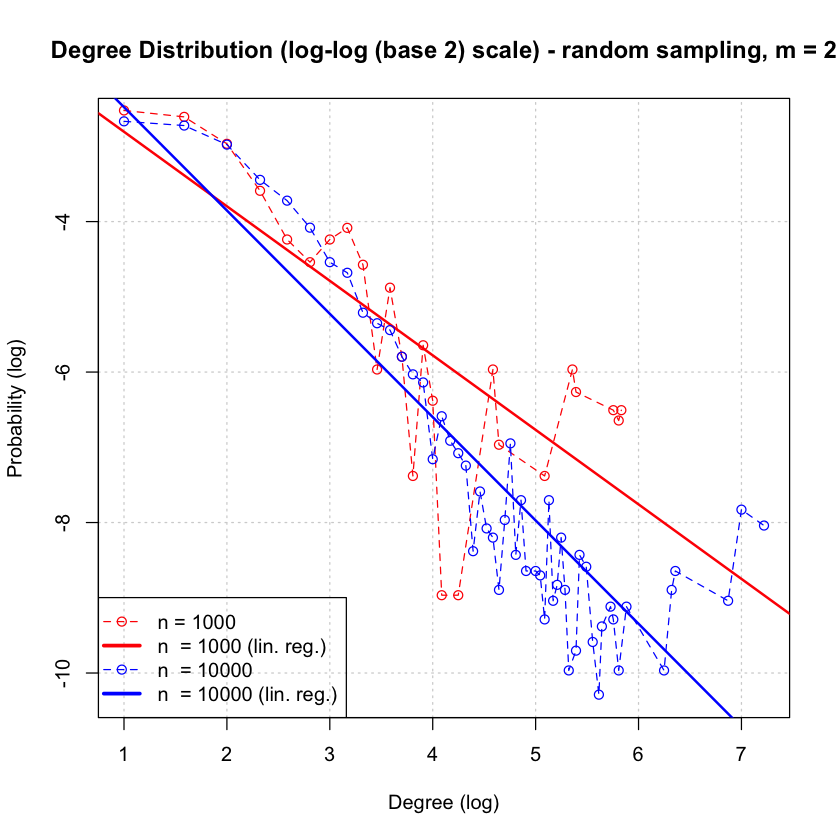

In [37]:
deg_n = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    i_n = sample(1000,1)
    i_j = neighbors(g,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n[i] = degree(g,i_j)    
}
dist_n = table(deg_n)
dist_n_1000 = log2(as.vector(dist_n)/1000)
deg_n_1000 = log2(as.numeric(names(dist_n)))

deg_n2 = matrix(data=0.0,nrow=10000,ncol=1)
for (i in 1:10000){
    i_n = sample(10000,1)
    i_j = neighbors(g3,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n2[i] = degree(g3,i_j)    
}
dist_n2 = table(deg_n2)
dist_n_10000 = log2(as.vector(dist_n2)/10000)
deg_n_10000 = log2(as.numeric(names(dist_n2)))

plot(deg_n_1000,dist_n_1000,main="Degree Distribution (log-log (base 2) scale) - random sampling, m = 2",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",xlim=c(1,max(deg_n_10000)),ylim=c(min(dist_n_10000),max(dist_n_10000)))
lines(deg_n_1000,dist_n_1000,lty=2,col="red")
abline(lm(dist_n_1000 ~ deg_n_1000),col="red",lwd=2)
points(deg_n_10000,dist_n_10000,col="blue")
lines(deg_n_10000,dist_n_10000,lty=2,col="blue")
abline(lm(dist_n_10000 ~ deg_n_10000),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n  = 1000 (lin. reg.)","n  = 10000", "n  = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2go.eps')
print("Slope and intercept for n = 1000:")
print(lm(dist_n_1000 ~ deg_n_1000))
print("Slope and intercept for n = 10000:")
print(lm(dist_n_10000 ~ deg_n_10000))

pdf 
  2

[1] "Slope and intercept for n = 1000:"

Call:
lm(formula = dist_n_1000 ~ deg_n_1000)

Coefficients:
(Intercept)   deg_n_1000  
     -1.504       -1.033  

[1] "Slope and intercept for n = 10000:"

Call:
lm(formula = dist_n_10000 ~ deg_n_10000)

Coefficients:
(Intercept)  deg_n_10000  
     -1.494       -1.168  



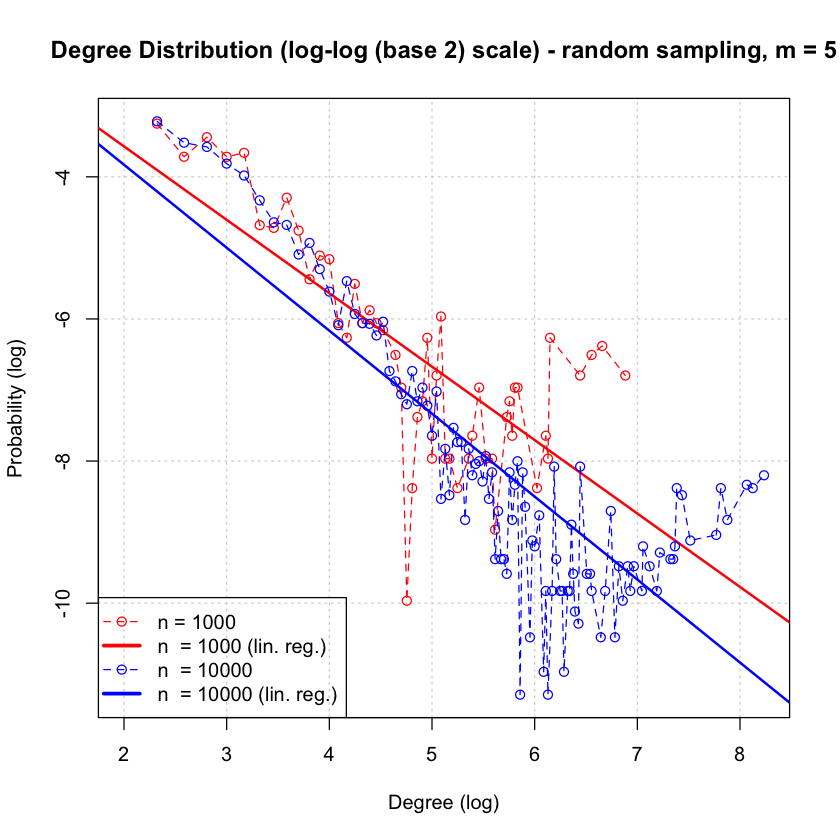

In [38]:
deg_n = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    i_n = sample(1000,1)
    i_j = neighbors(g2,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n[i] = degree(g2,i_j)    
}
dist_n = table(deg_n)
dist_n_1000 = log2(as.vector(dist_n)/1000)
deg_n_1000 = log2(as.numeric(names(dist_n)))

deg_n2 = matrix(data=0.0,nrow=10000,ncol=1)
for (i in 1:10000){
    i_n = sample(10000,1)
    i_j = neighbors(g4,i_n)
    if(length(i_j)>1){
        i_j = sample(i_j,1)
    }
    deg_n2[i] = degree(g4,i_j)    
}
dist_n2 = table(deg_n2)
dist_n_10000 = log2(as.vector(dist_n2)/10000)
deg_n_10000 = log2(as.numeric(names(dist_n2)))

plot(deg_n_1000,dist_n_1000,main="Degree Distribution (log-log (base 2) scale) - random sampling, m = 5",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",xlim=c(2,max(deg_n_10000)),ylim=c(min(dist_n_10000),max(dist_n_10000)))
lines(deg_n_1000,dist_n_1000,lty=2,col="red")
abline(lm(dist_n_1000 ~ deg_n_1000),col="red",lwd=2)
points(deg_n_10000,dist_n_10000,col="blue")
lines(deg_n_10000,dist_n_10000,lty=2,col="blue")
abline(lm(dist_n_10000 ~ deg_n_10000),col="blue",lwd=2)
legend('bottomleft', legend = c("n = 1000", "n  = 1000 (lin. reg.)","n  = 10000", "n  = 10000 (lin. reg.)"),
       lty = c(2, 1, 2,1), lwd = c(1,3,1,3), pch=c(1,NA,1,NA),
       col = c('red','red','blue','blue'))
dev.copy2eps(file='Q2gp.eps')
print("Slope and intercept for n = 1000:")
print(lm(dist_n_1000 ~ deg_n_1000))
print("Slope and intercept for n = 10000:")
print(lm(dist_n_10000 ~ deg_n_10000))

pdf 
  2

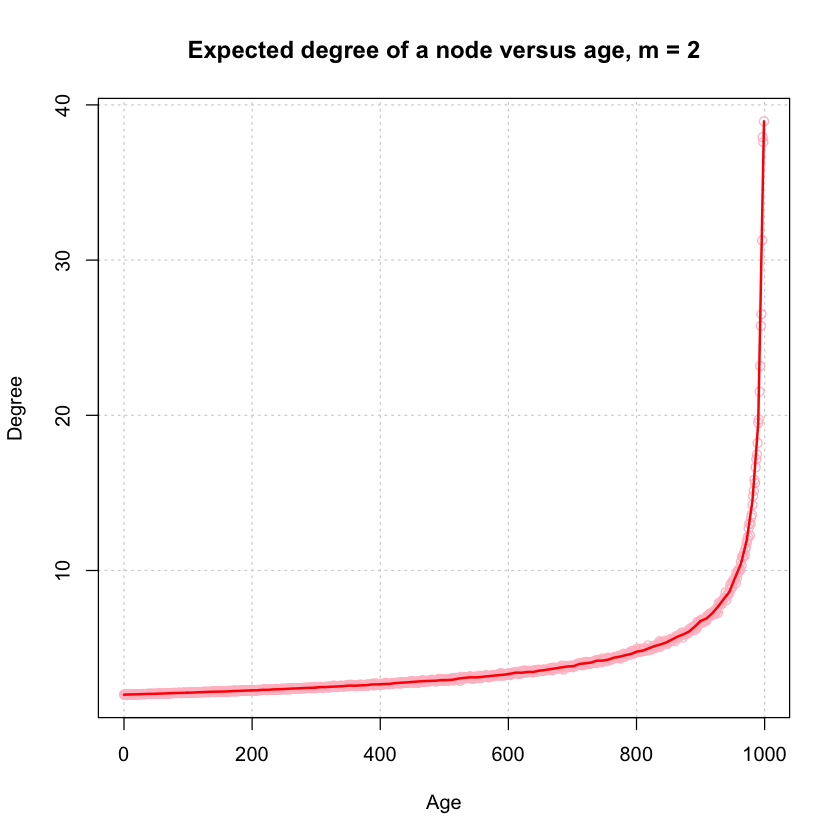

In [39]:
deg_age = matrix(data=0.0,nrow = 1000,ncol=1)
for (i in 1:1000) {
    g <- barabasi.game(1000, m=2, directed=FALSE)
    deg_age = deg_age+degree(g)
}
deg_age = deg_age/1000
plot(seq(999,0,-1),deg_age,col='pink',ylab="Degree",xlab="Age",main="Expected degree of a node versus age, m = 2",grid())
lines(lowess(seq(999,0,-1),deg_age,f = 0.01), col="red",lwd = 2)
dev.copy2eps(file='Q2gq.eps')

pdf 
  2

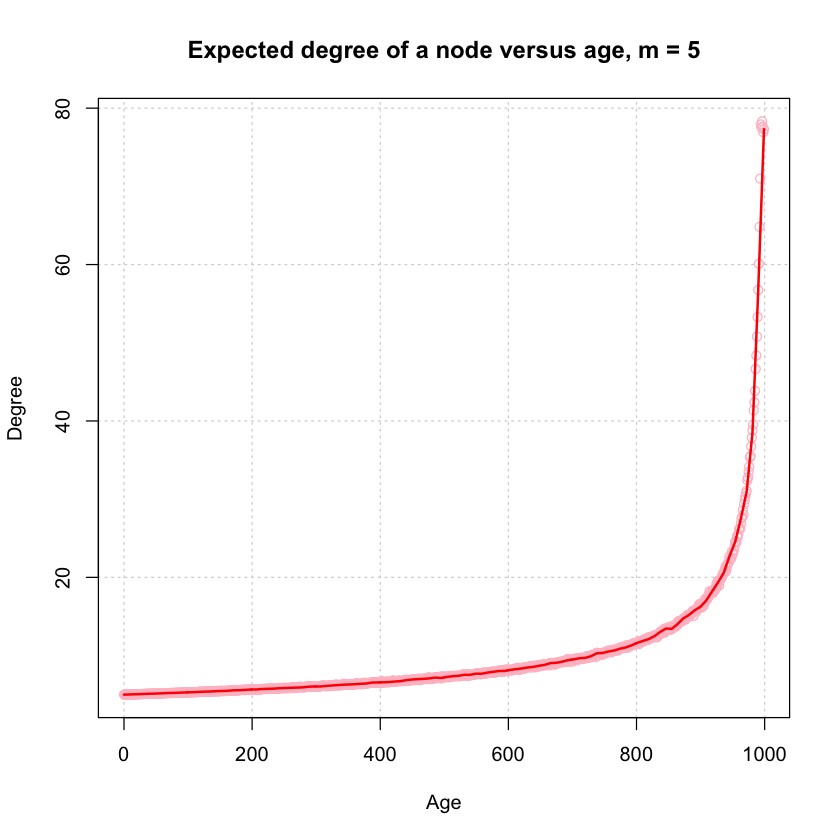

In [40]:
deg_age = matrix(data=0.0,nrow = 1000,ncol=1)
for (i in 1:1000) {
    g <- barabasi.game(1000, m=5, directed=FALSE)
    deg_age = deg_age+degree(g)
}
deg_age = deg_age/1000
plot(seq(999,0,-1),deg_age,col='pink',ylab="Degree",xlab="Age",main="Expected degree of a node versus age, m = 5",grid())
lines(lowess(seq(999,0,-1),deg_age,f = 0.005), col="red",lwd = 2)
dev.copy2eps(file='Q2gr.eps')

## Question 2h

pdf 
  2

[1] "Modularity: 0.930920"


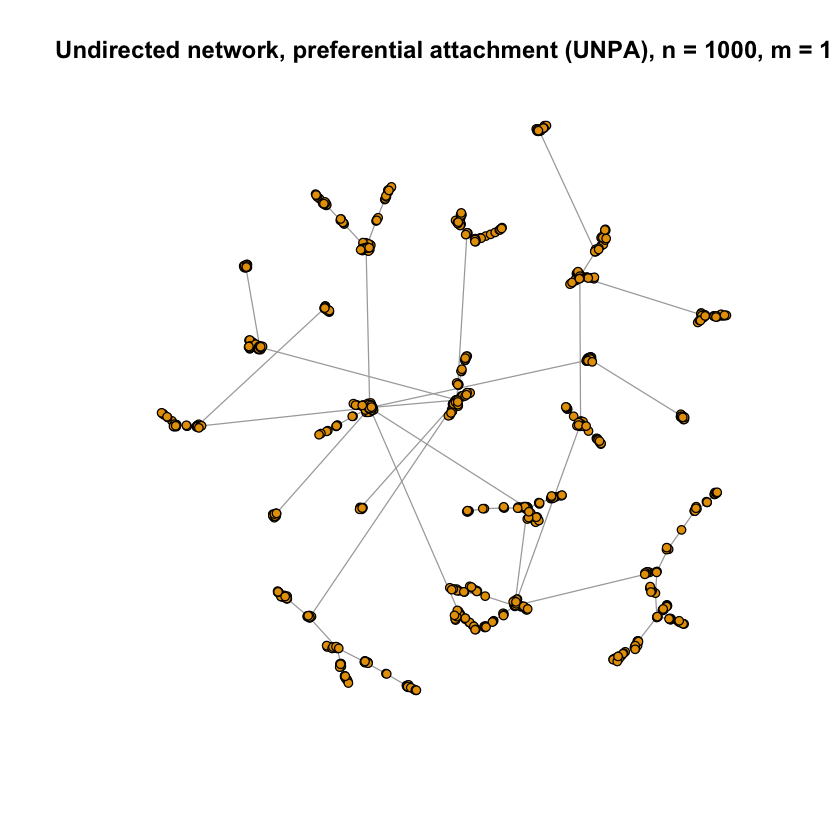

pdf 
  2

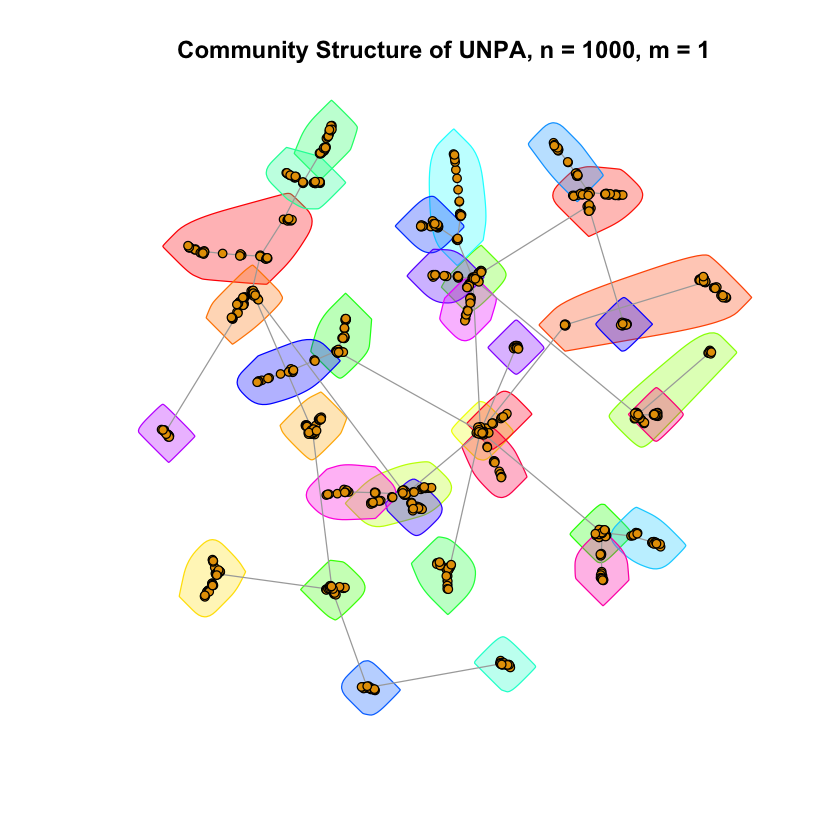

pdf 
  2

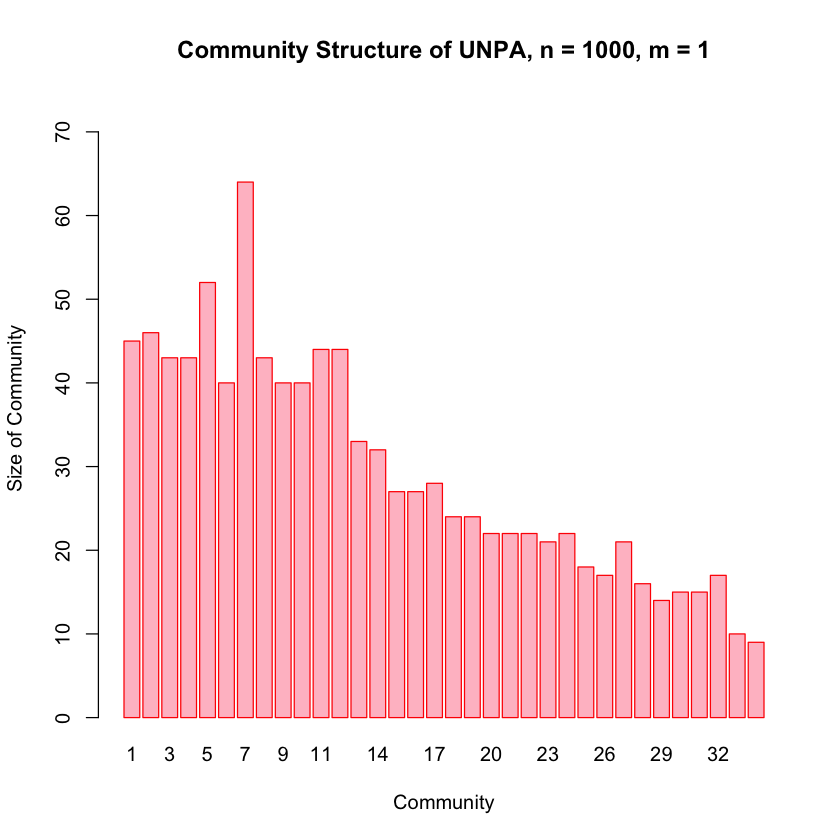

In [41]:
g <- barabasi.game(1000, m=1, directed=FALSE)
comm_struct <- cluster_fast_greedy(g)
plot(g,vertex.label="",vertex.size=3,main = "Undirected network, preferential attachment (UNPA), n = 1000, m = 1")
dev.copy2eps(file='Q2ha.eps')
mod <- modularity(comm_struct)
print(sprintf("Modularity: %f",mod))
plot(g, mark.groups = groups(comm_struct), vertex.size=3, vertex.label="",main="Community Structure of UNPA, n = 1000, m = 1")
dev.copy2pdf(file='Q2hb.pdf')
barplot(as.vector(sizes(comm_struct)),names.arg = seq(1,length(comm_struct),1),main="Community Structure of UNPA, n = 1000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct)))+10),border="red",col="pink")
dev.copy2eps(file='Q2hc.eps')

pdf 
  2

[1] "Modularity: 0.932926"


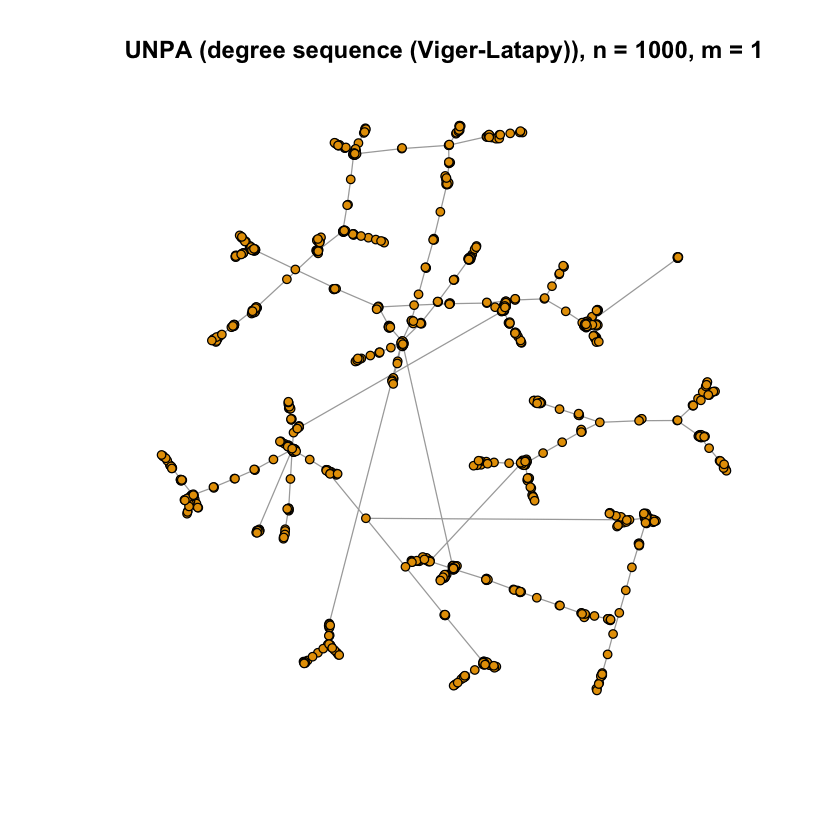

pdf 
  2

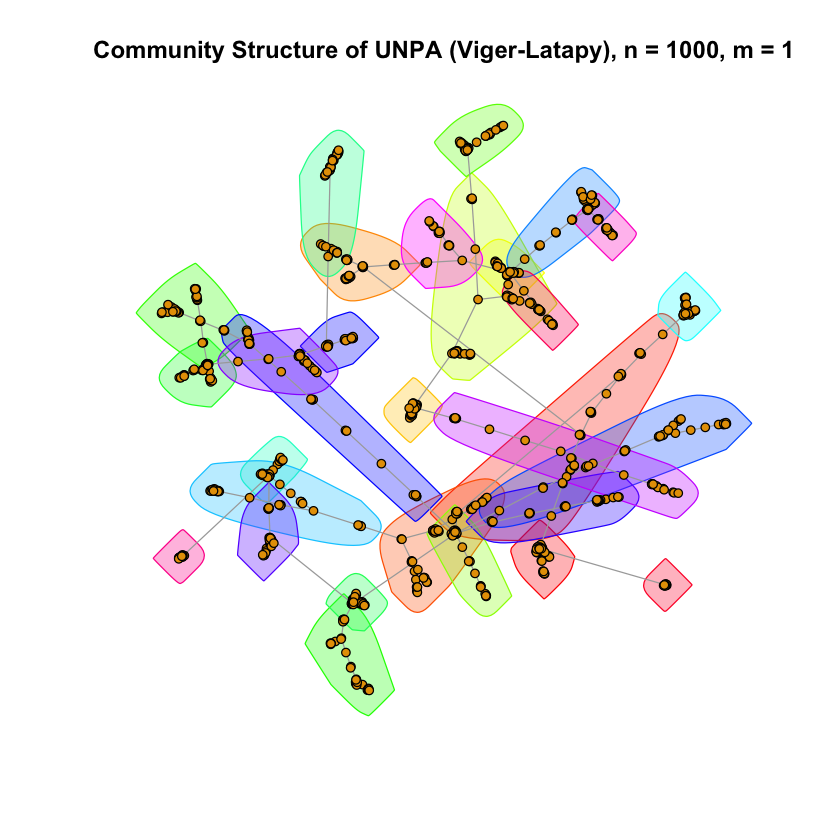

pdf 
  2

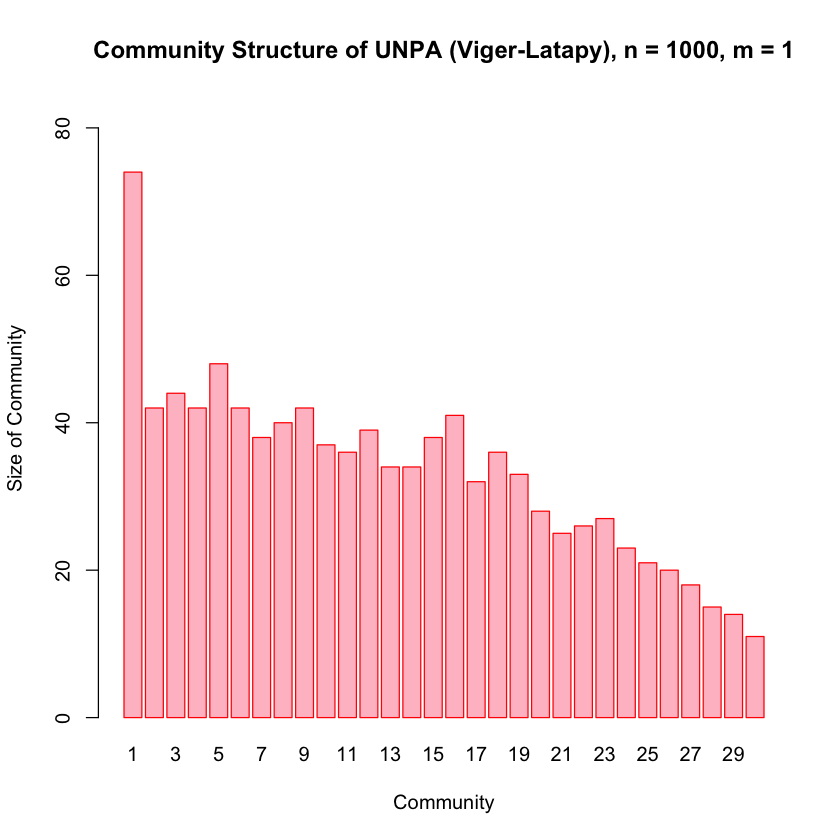

In [42]:
g2 <- sample_degseq(degree(g),method = 'vl')
comm_struct2 <- cluster_fast_greedy(g2)
plot(g2,vertex.label="",vertex.size=3,main = "UNPA (degree sequence (Viger-Latapy)), n = 1000, m = 1")
dev.copy2eps(file='Q2hd.eps')
mod <- modularity(comm_struct2)
print(sprintf("Modularity: %f",mod))
plot(g2, mark.groups = groups(comm_struct2), vertex.size=3, vertex.label="",main="Community Structure of UNPA (Viger-Latapy), n = 1000, m = 1")
dev.copy2pdf(file='Q2he.pdf')
barplot(as.vector(sizes(comm_struct2)),names.arg = seq(1,length(comm_struct2),1),main="Community Structure of UNPA (Viger-Latapy), n = 1000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct2)))+10),border="red",col="pink")
dev.copy2eps(file='Q2hf.eps')

pdf 
  2

[1] "Modularity: 0.834776"


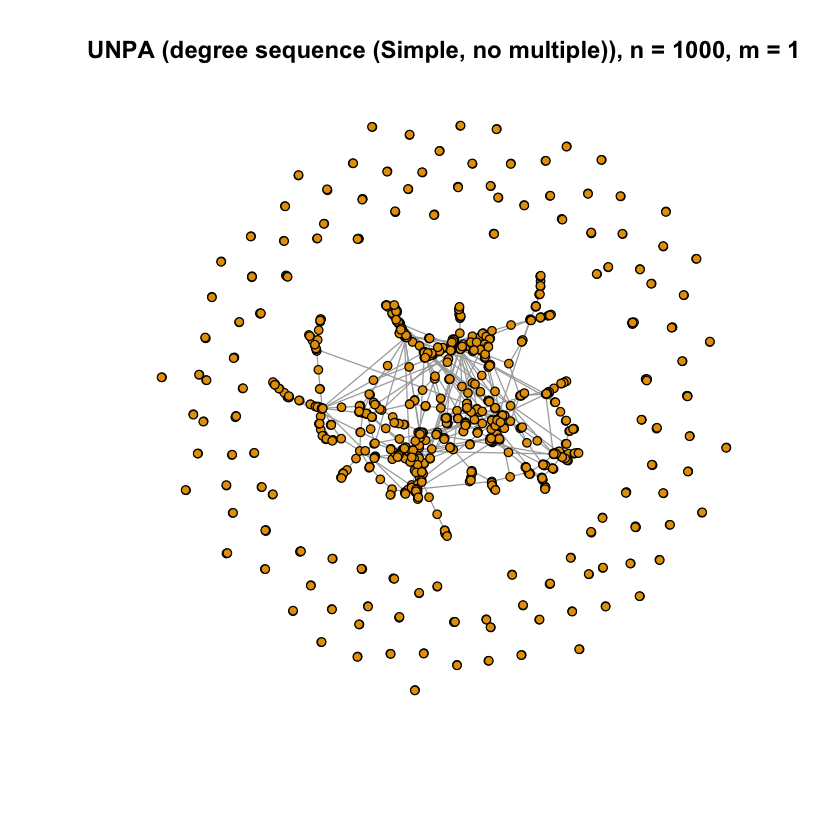

pdf 
  2

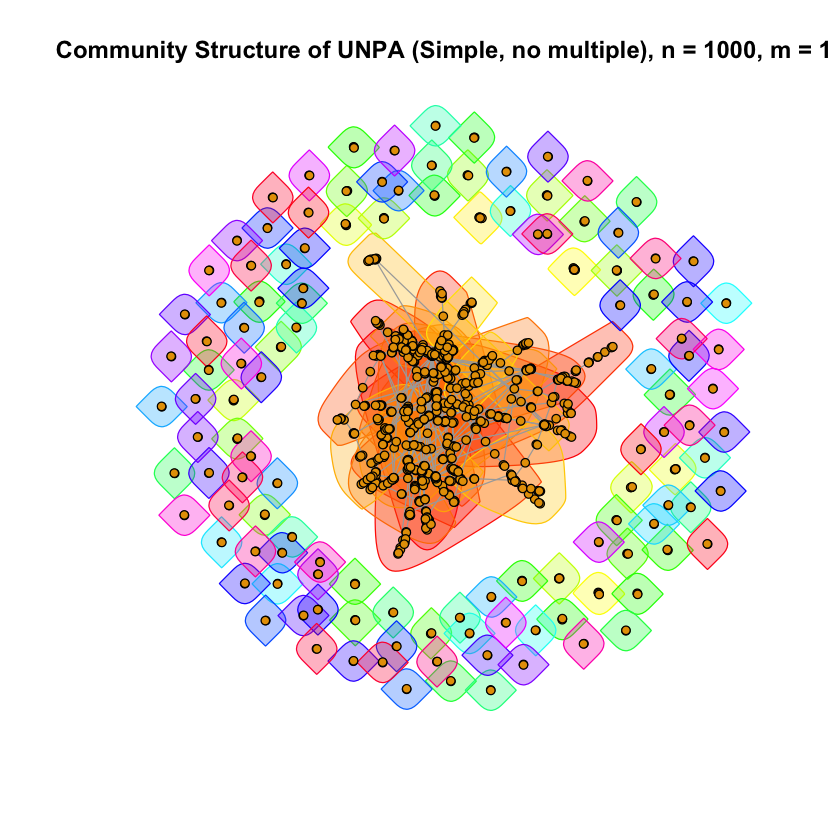

pdf 
  2

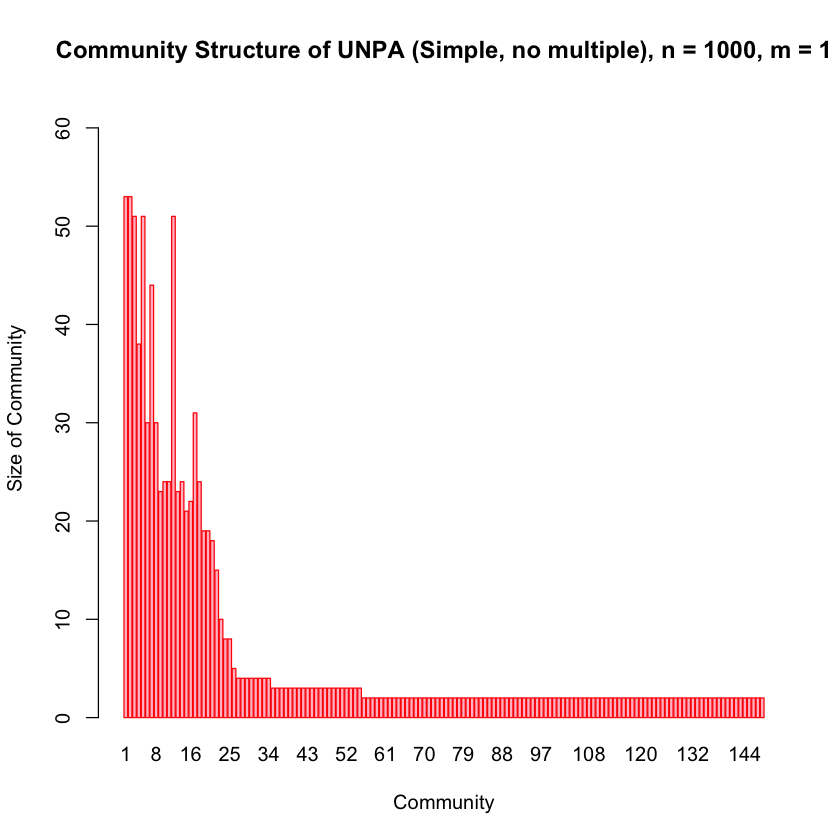

In [43]:
g3 <- sample_degseq(degree(g),method = 'simple.no.multiple')
comm_struct3 <- cluster_fast_greedy(g3)
plot(g3,vertex.label="",vertex.size=3,main = "UNPA (degree sequence (Simple, no multiple)), n = 1000, m = 1")
dev.copy2eps(file='Q2hg.eps')
mod <- modularity(comm_struct3)
print(sprintf("Modularity: %f",mod))
plot(g3, mark.groups = groups(comm_struct3), vertex.size=3, vertex.label="",main="Community Structure of UNPA (Simple, no multiple), n = 1000, m = 1")
dev.copy2pdf(file='Q2hh.pdf')
barplot(as.vector(sizes(comm_struct3)),names.arg = seq(1,length(comm_struct3),1),main="Community Structure of UNPA (Simple, no multiple), n = 1000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct3)))+10),border="red",col="pink")
dev.copy2eps(file='Q2hi.eps')

pdf 
  2

[1] "Modularity: 0.737921"


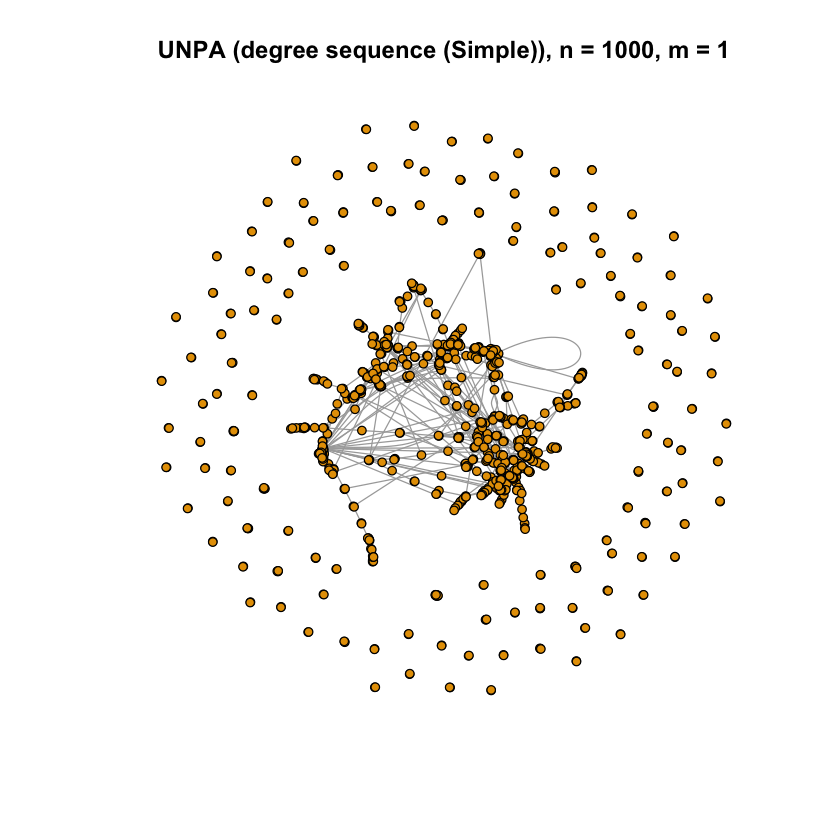

pdf 
  2

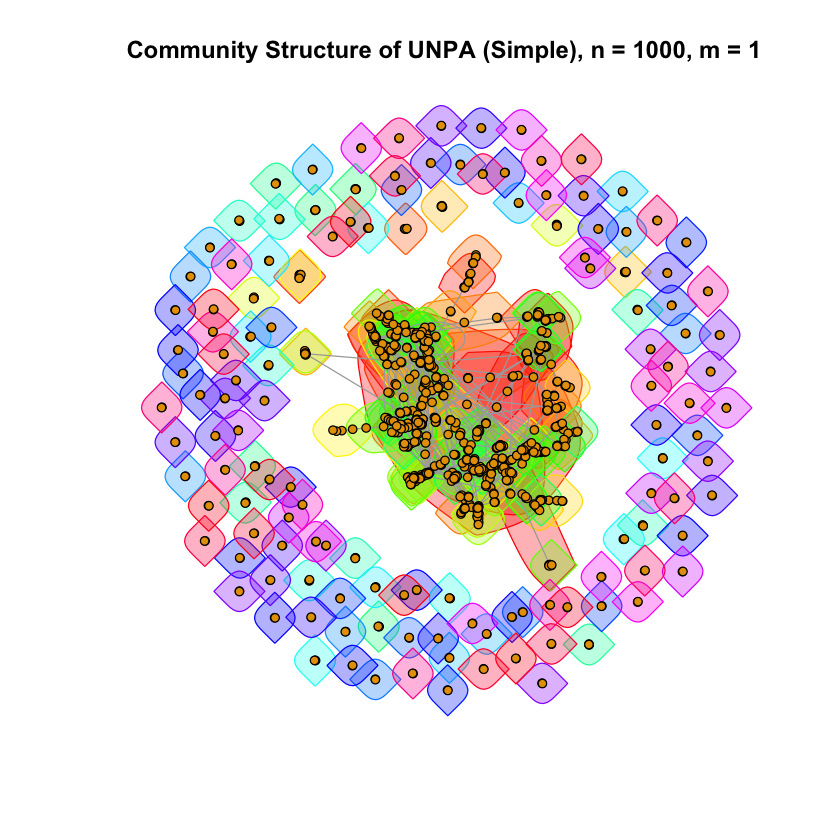

pdf 
  2

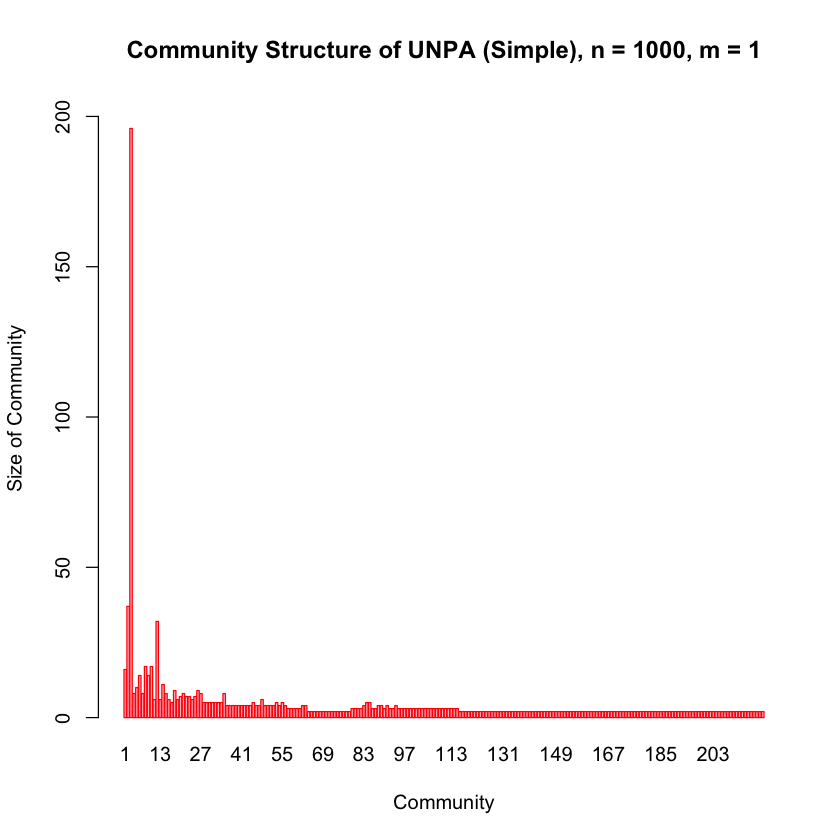

In [44]:
g4 <- sample_degseq(degree(g),method = 'simple')
comm_struct4 <- walktrap.community(g4)
plot(g4,vertex.label="",vertex.size=3,main = "UNPA (degree sequence (Simple)), n = 1000, m = 1")
dev.copy2eps(file='Q2hj.eps')
mod <- modularity(comm_struct4)
print(sprintf("Modularity: %f",mod))
plot(g4, mark.groups = groups(comm_struct4), vertex.size=3, vertex.label="",main="Community Structure of UNPA (Simple), n = 1000, m = 1")
dev.copy2pdf(file='Q2hk.pdf')
barplot(as.vector(sizes(comm_struct4)),names.arg = seq(1,length(comm_struct4),1),main="Community Structure of UNPA (Simple), n = 1000, m = 1",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct4)))+10),border="red",col="pink")
dev.copy2eps(file='Q2hl.eps')

## Question 3a

pdf 
  2

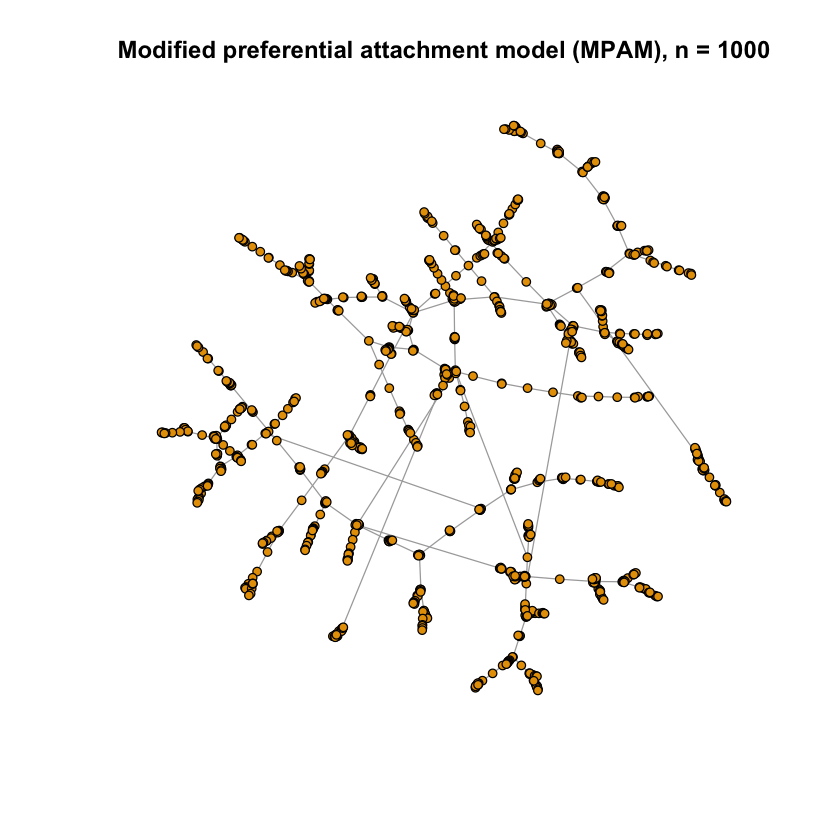

In [45]:
g <- sample_pa_age(n=1000, directed = FALSE, m=1, pa.exp=1, aging.exp=-1, 
                   zero.deg.appeal = 1, zero.age.appeal = 0, deg.coef = 1, age.coef = 1)
plot(g,vertex.label="",vertex.size=3,main = "Modified preferential attachment model (MPAM), n = 1000")
dev.copy2eps(file='Q3aa.eps')

pdf 
  2

[1] "Slope and intercept for MPAM:"

Call:
lm(formula = dist_1 ~ deg_1)

Coefficients:
(Intercept)        deg_1  
      2.945       -3.248  



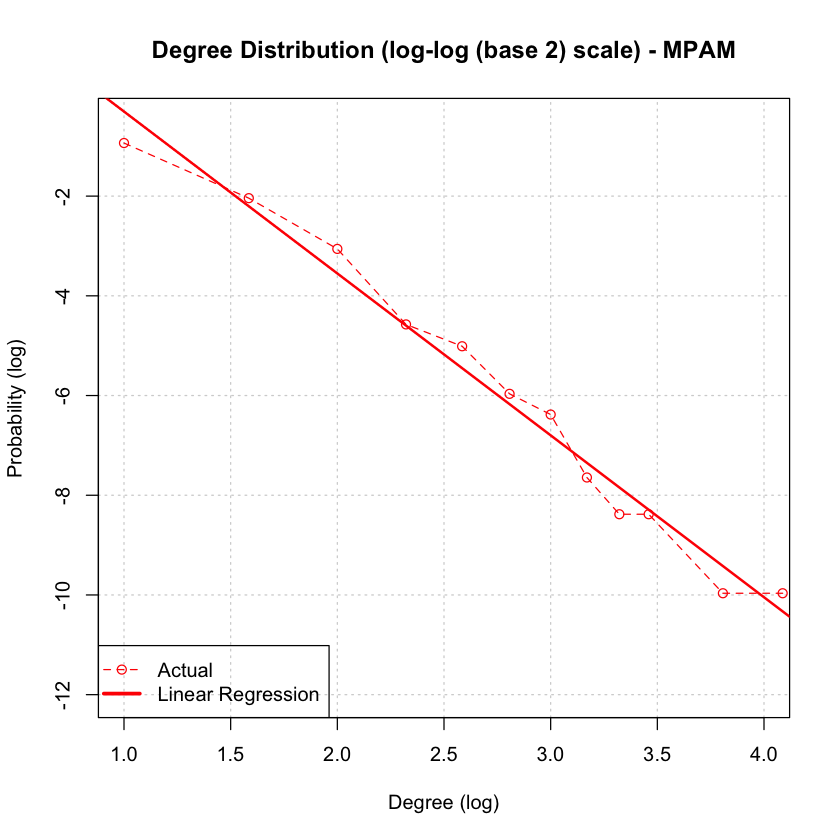

In [46]:
deg_dist_1 = degree.distribution(g)
deg_1 <- log2(c(1:length(deg_dist_1)))[which(deg_dist_1 !=0, arr.ind = TRUE)]
dist_1 <- log2(deg_dist_1)[which(deg_dist_1 !=0, arr.ind = TRUE)]
plot(deg_1,dist_1,main="Degree Distribution (log-log (base 2) scale) - MPAM",
     xlab="Degree (log)",ylab="Probability (log)",grid(),col="red",ylim=c(-12,-0.5),xlim=c(1,4))
lines(deg_1,dist_1,lty=2,col="red")
abline(lm(dist_1 ~ deg_1),col="red",lwd=2)

legend('bottomleft', legend = c("Actual","Linear Regression"),
       lty = c(2, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('red','red'))
dev.copy2eps(file='Q3ab.eps')
print("Slope and intercept for MPAM:")
print(lm(dist_1 ~ deg_1))

## Question 3b

[1] "Modularity: 0.935772"


pdf 
  2

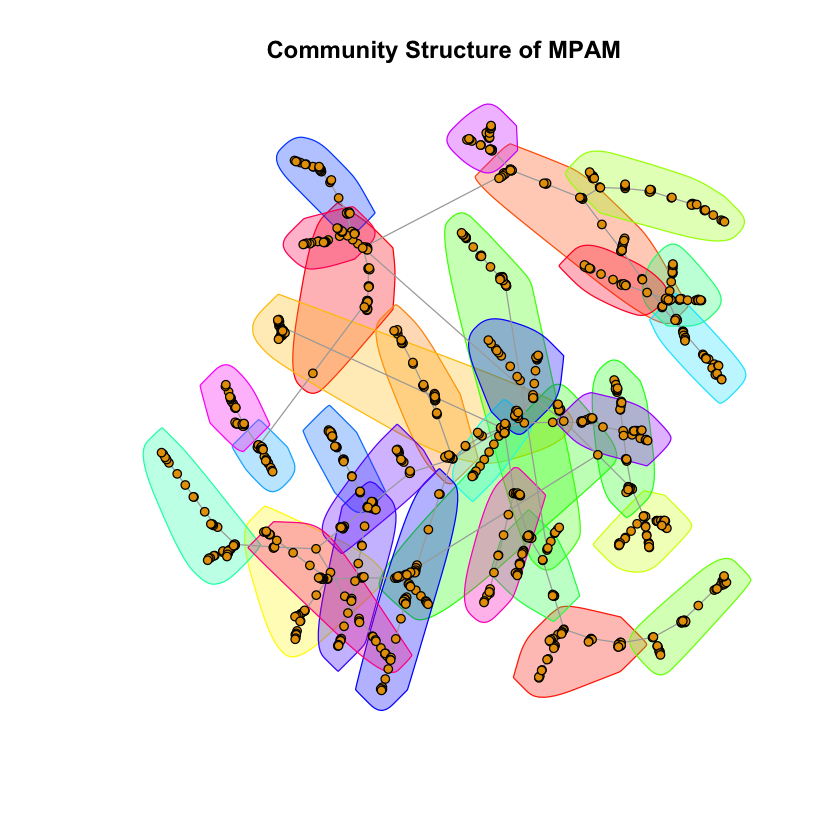

In [47]:
comm_struct <- cluster_fast_greedy(g)
mod <- modularity(comm_struct)
print(sprintf("Modularity: %f",mod))
plot(g, mark.groups = groups(comm_struct), vertex.size=3, vertex.label="",main="Community Structure of MPAM")
dev.copy2pdf(file='Q3ba.pdf')

pdf 
  2

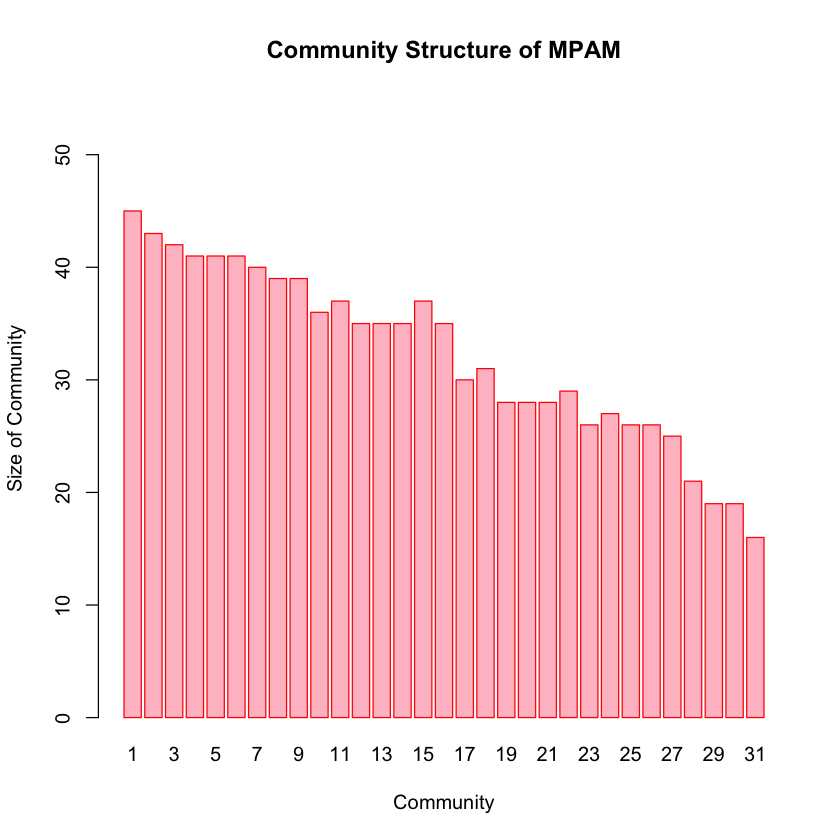

In [48]:
barplot(as.vector(sizes(comm_struct)),names.arg = seq(1,length(comm_struct),1),main="Community Structure of MPAM",
   xlab="Community",ylab="Size of Community",ylim=c(0,max(as.vector(sizes(comm_struct)))+10),border="red",col="pink")
dev.copy2eps(file='Q3bb.eps')

# Random Walk on Networks 

## Question 1a

pdf 
  2

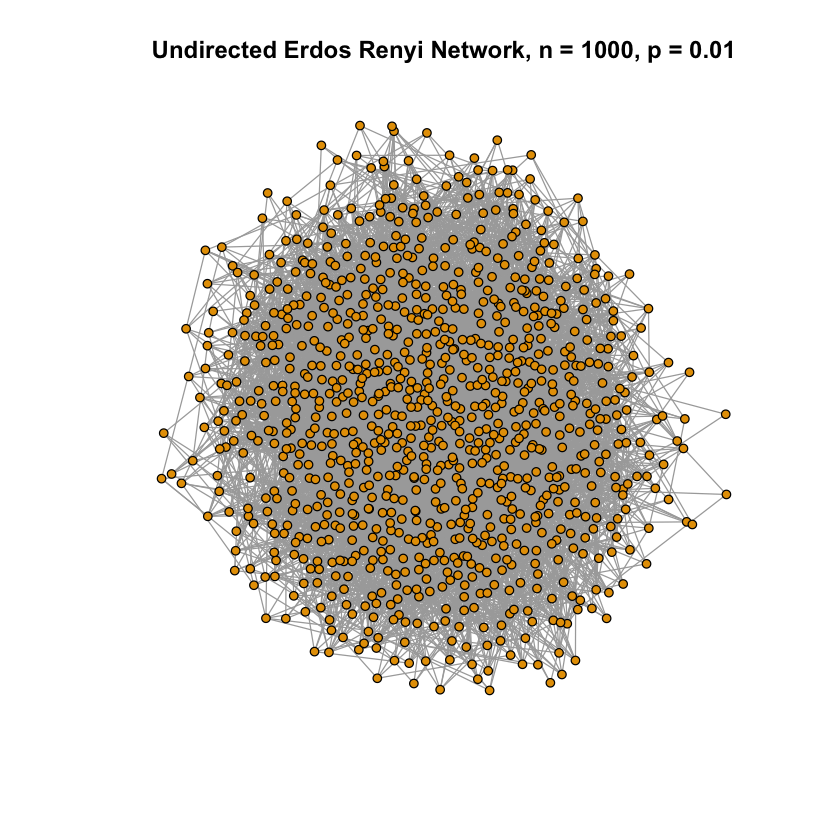

In [49]:
g <- erdos.renyi.game(n = 1000,type = "gnp",p=0.01,directed = FALSE)
plot(g,vertex.label="",vertex.size=3,main = "Undirected Erdos Renyi Network, n = 1000, p = 0.01")
dev.copy2eps(file='2Q1a.eps')

## Question 1b and 1c

In [50]:
s_t = matrix(data=0.0, nrow=1000, ncol=100)
term_node_deg = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    if(is_connected(g)){
        gcc <- g
    }
    else{
        g.components <- clusters(g)
        ix <- which.max(g.components$csize)
        g.giant <- induced.subgraph(g, which(g.components$membership == ix))
        gcc <- g.giant
    }
    start = sample(V(gcc), 1)
    walked_nodes = random_walk(gcc, steps=100, start)
    s_t[i,] = shortest.paths(gcc, walked_nodes, start)
    term_node_deg[i,1] = degree(gcc, walked_nodes[length(walked_nodes)])  
}

pdf 
  2

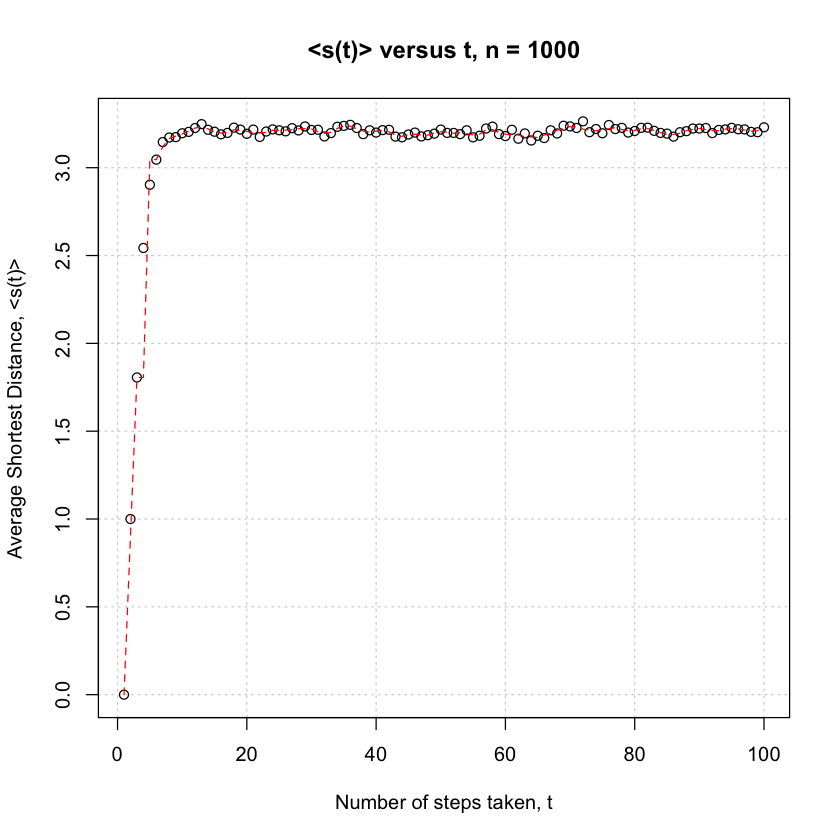

In [51]:
plot(seq(1,100,1),colMeans(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Shortest Distance, <s(t)>',main="<s(t)> versus t, n = 1000")
lines(lowess(seq(1,100,1),colMeans(s_t),f = 0.04), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q1ba.eps')

pdf 
  2

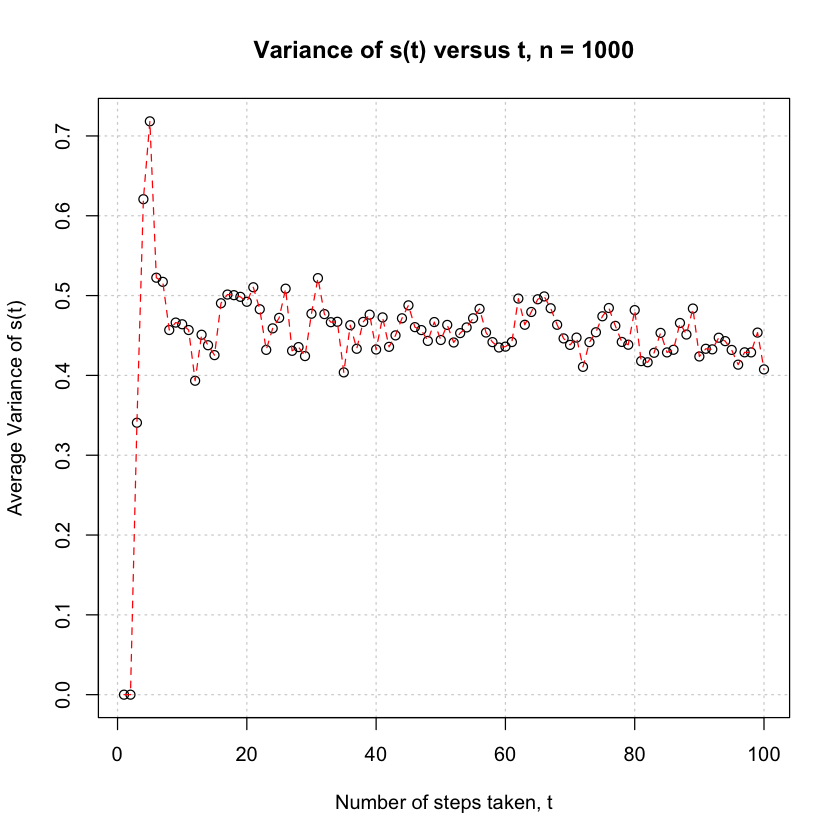

In [52]:
plot(seq(1,100,1),colVars(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Variance of s(t)',main="Variance of s(t) versus t, n = 1000")
lines(lowess(seq(1,100,1),colVars(s_t),f = 0.03), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q1bb.eps')

pdf 
  2

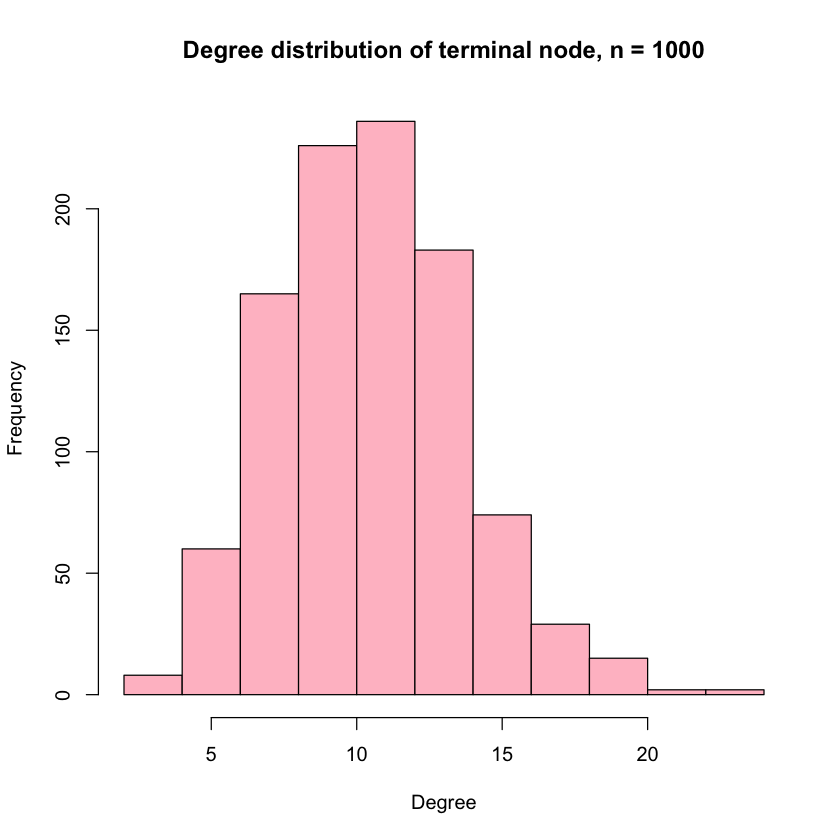

pdf 
  2

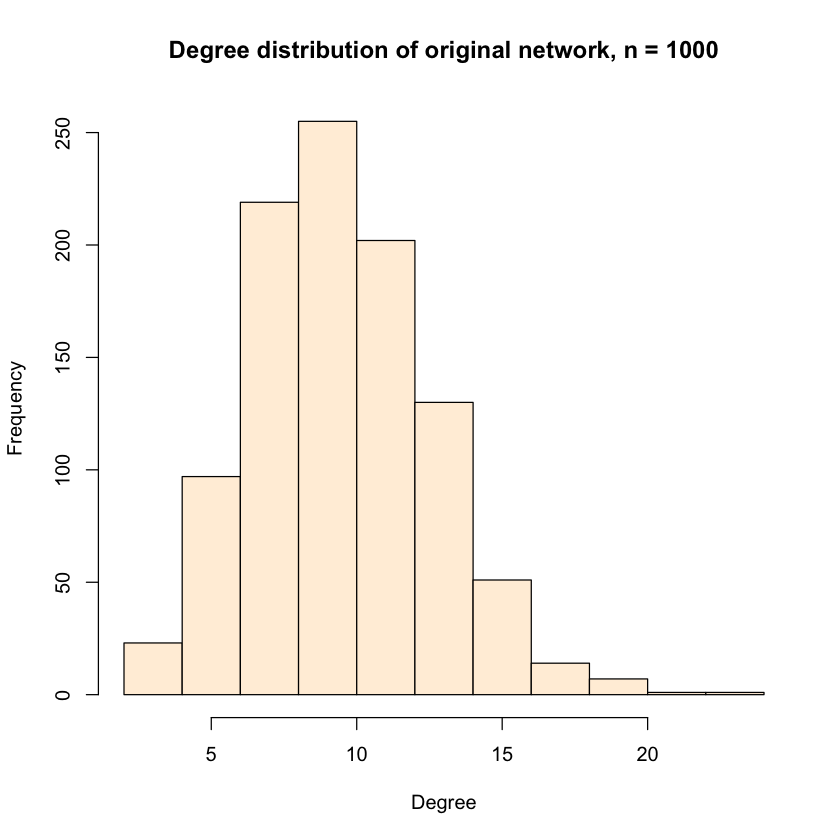

In [53]:
hist(term_node_deg,col='pink',main="Degree distribution of terminal node, n = 1000",xlab='Degree',ylab='Frequency')
dev.copy2eps(file='2Q1ca.eps')
hist(degree(g),col='antiquewhite1',main="Degree distribution of original network, n = 1000",xlab='Degree',ylab='Frequency')
dev.copy2eps(file='2Q1cb.eps')

In [54]:
print(diameter(g))

[1] 5


## Question 1d

pdf 
  2

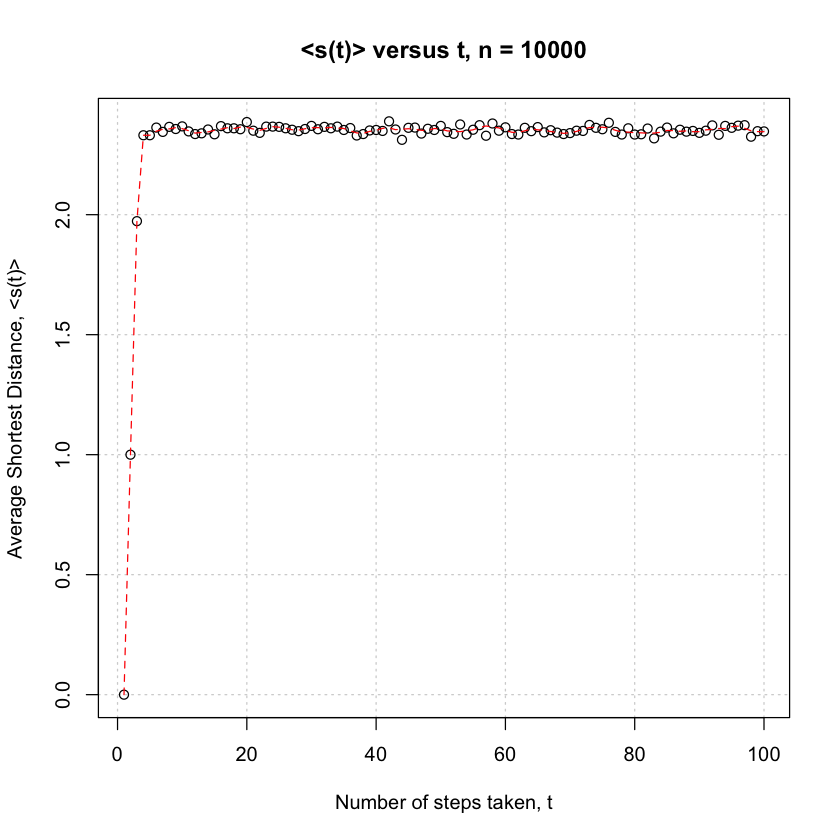

pdf 
  2

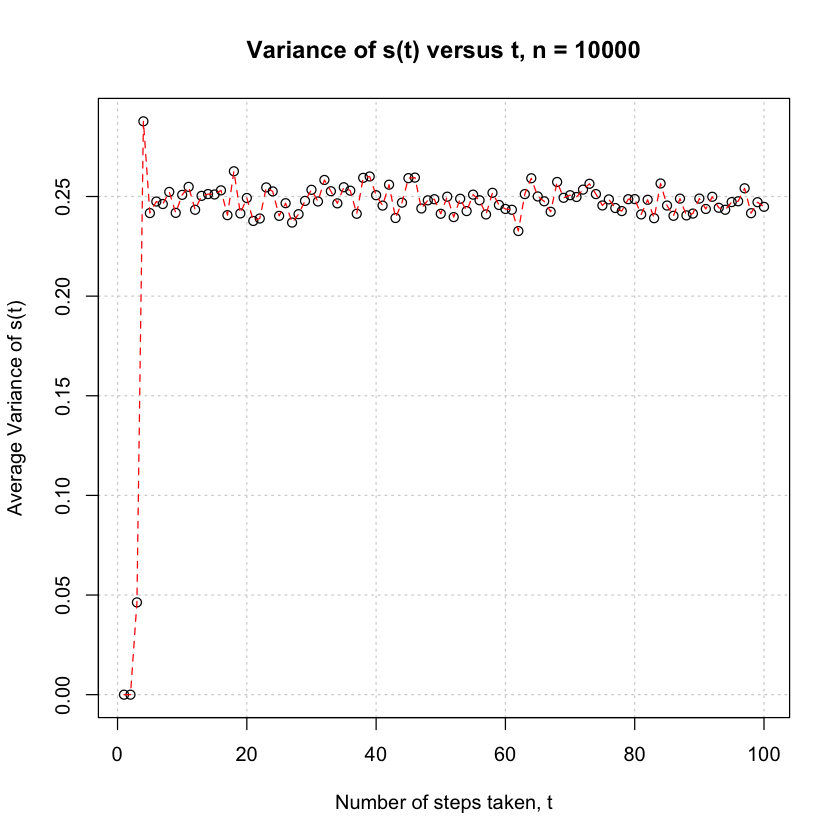

In [55]:
g <- erdos.renyi.game(n = 10000,type = "gnp",p=0.01,directed = FALSE)
s_t = matrix(data=0.0, nrow=1000, ncol=100)
term_node_deg = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    if(is_connected(g)){
        gcc <- g
    }
    else{
        g.components <- clusters(g)
        ix <- which.max(g.components$csize)
        g.giant <- induced.subgraph(g, which(g.components$membership == ix))
        gcc <- g.giant
    }
    start = sample(V(gcc), 1)
    walked_nodes = random_walk(gcc, steps=100, start)
    s_t[i,] = shortest.paths(gcc, walked_nodes, start)
    term_node_deg[i,1] = degree(gcc, walked_nodes[length(walked_nodes)])  
}
plot(seq(1,100,1),colMeans(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Shortest Distance, <s(t)>',main="<s(t)> versus t, n = 10000")
lines(lowess(seq(1,100,1),colMeans(s_t),f = 0.05), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q1da.eps')

plot(seq(1,100,1),colVars(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Variance of s(t)',main="Variance of s(t) versus t, n = 10000")
lines(lowess(seq(1,100,1),colVars(s_t),f = 0.03), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q1db.eps')

In [56]:
print(diameter(g))

[1] 3


## Question 2a

pdf 
  2

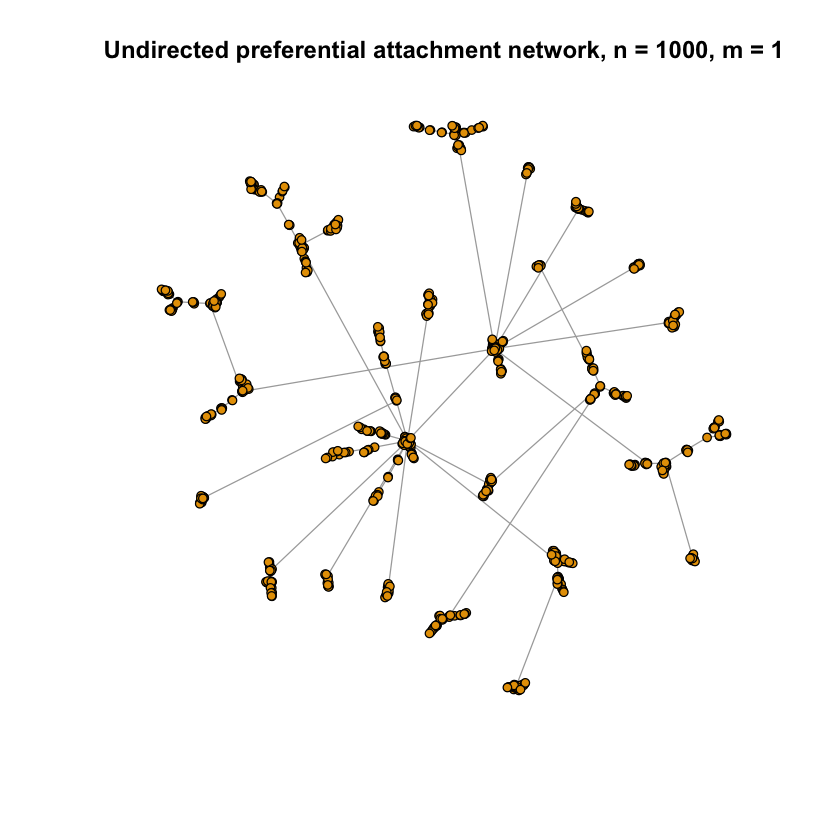

In [11]:
g <- barabasi.game(1000, m=1, directed=FALSE)
plot(g,vertex.label="",vertex.size=3,main = "Undirected preferential attachment network, n = 1000, m = 1")
dev.copy2eps(file='2Q2a.eps')

## Question 2b

pdf 
  2

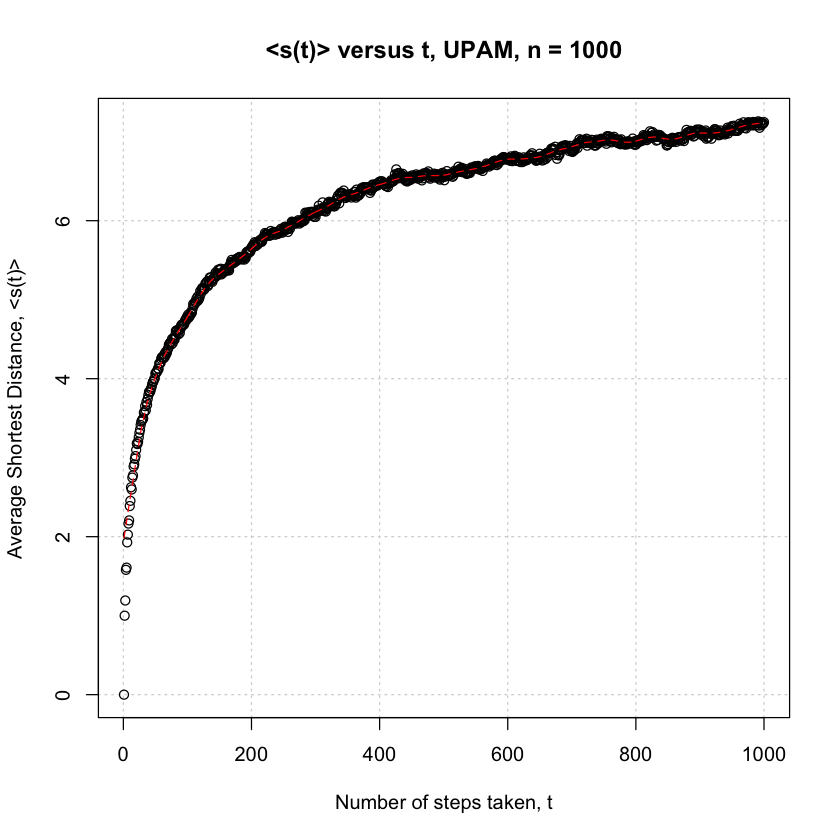

pdf 
  2

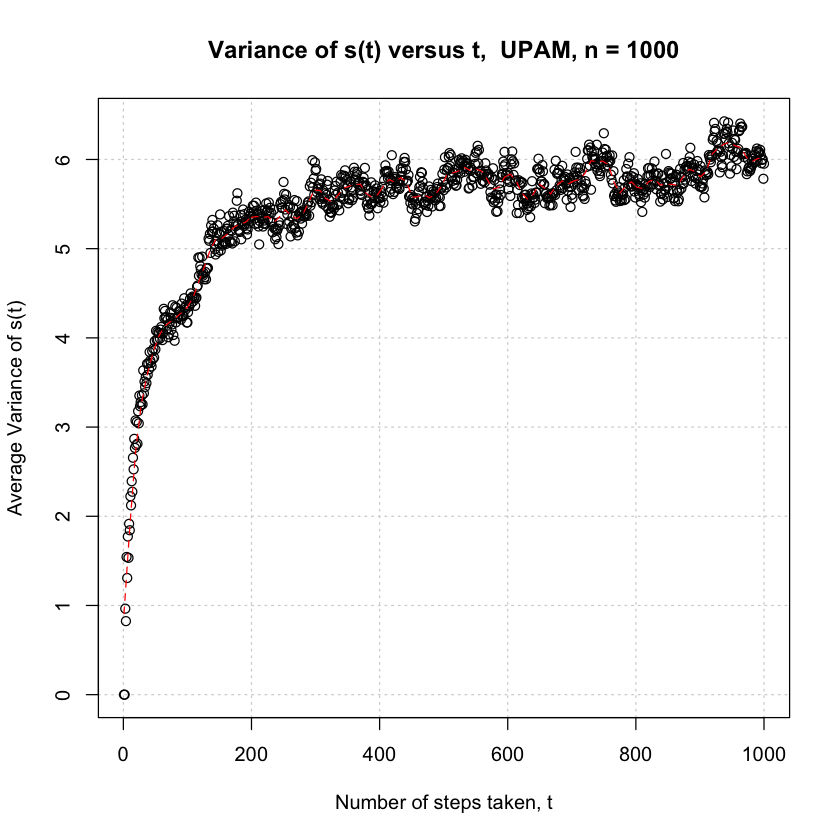

In [13]:
s_t = matrix(data=0.0, nrow=1000, ncol=1000)
term_node_deg = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    if(is_connected(g)){
        gcc <- g
    }
    else{
        g.components <- clusters(g)
        ix <- which.max(g.components$csize)
        g.giant <- induced.subgraph(g, which(g.components$membership == ix))
        gcc <- g.giant
    }
    start = sample(V(gcc), 1)
    walked_nodes = random_walk(gcc, steps=1000, start)
    s_t[i,] = shortest.paths(gcc, walked_nodes, start)
    term_node_deg[i,1] = degree(gcc, walked_nodes[length(walked_nodes)])  
}
plot(seq(1,1000,1),colMeans(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Shortest Distance, <s(t)>',main="<s(t)> versus t, UPAM, n = 1000")
lines(lowess(seq(1,1000,1),colMeans(s_t),f = 0.05), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2ba.eps')

plot(seq(1,1000,1),colVars(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Variance of s(t)',main="Variance of s(t) versus t,  UPAM, n = 1000")
lines(lowess(seq(1,1000,1),colVars(s_t),f = 0.03), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2bb.eps')

## Question 2c

pdf 
  2

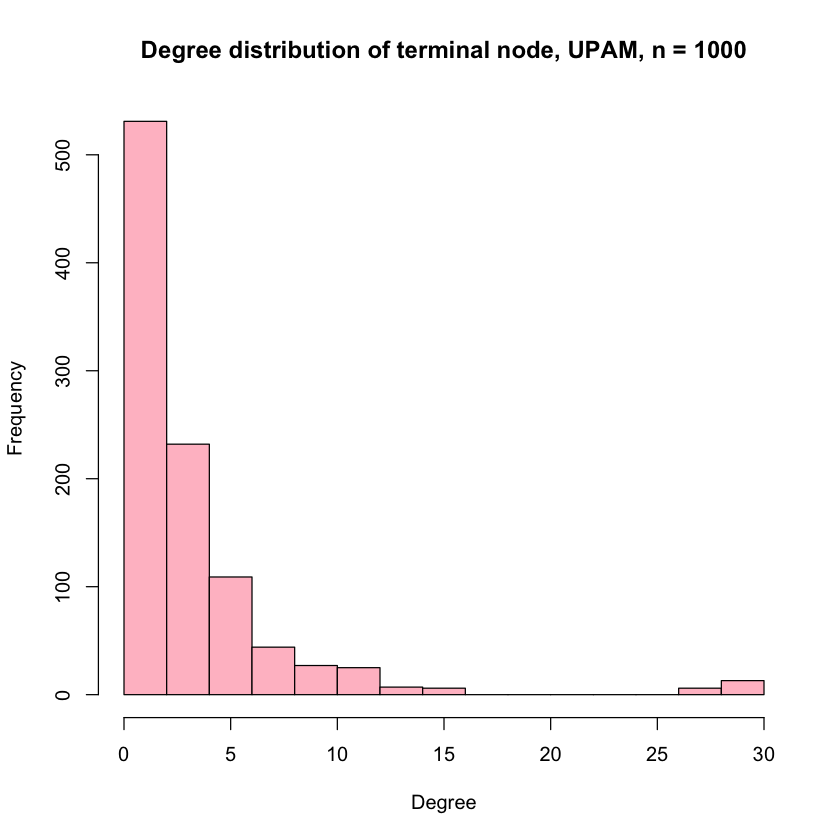

pdf 
  2

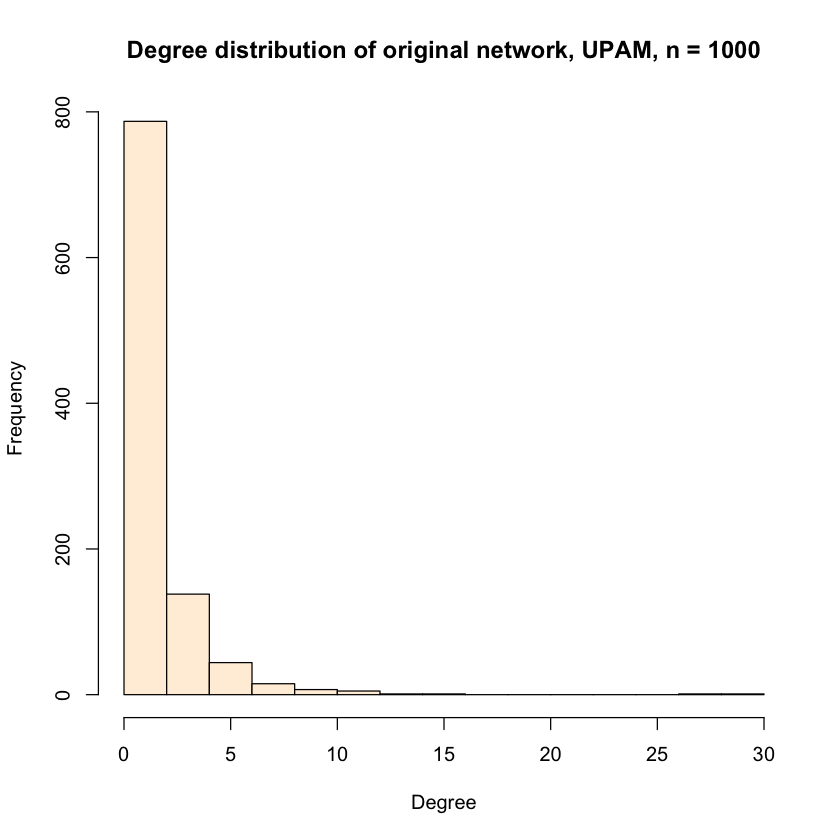

In [14]:
hist(term_node_deg,col='pink',main="Degree distribution of terminal node, UPAM, n = 1000",xlab='Degree',ylab='Frequency')
dev.copy2eps(file='2Q2ca.eps')
hist(degree(g),col='antiquewhite1',main="Degree distribution of original network, UPAM, n = 1000",xlab='Degree',ylab='Frequency')
dev.copy2eps(file='2Q2cb.eps')

In [15]:
print(diameter(g))

[1] 18


## Question 2d

pdf 
  2

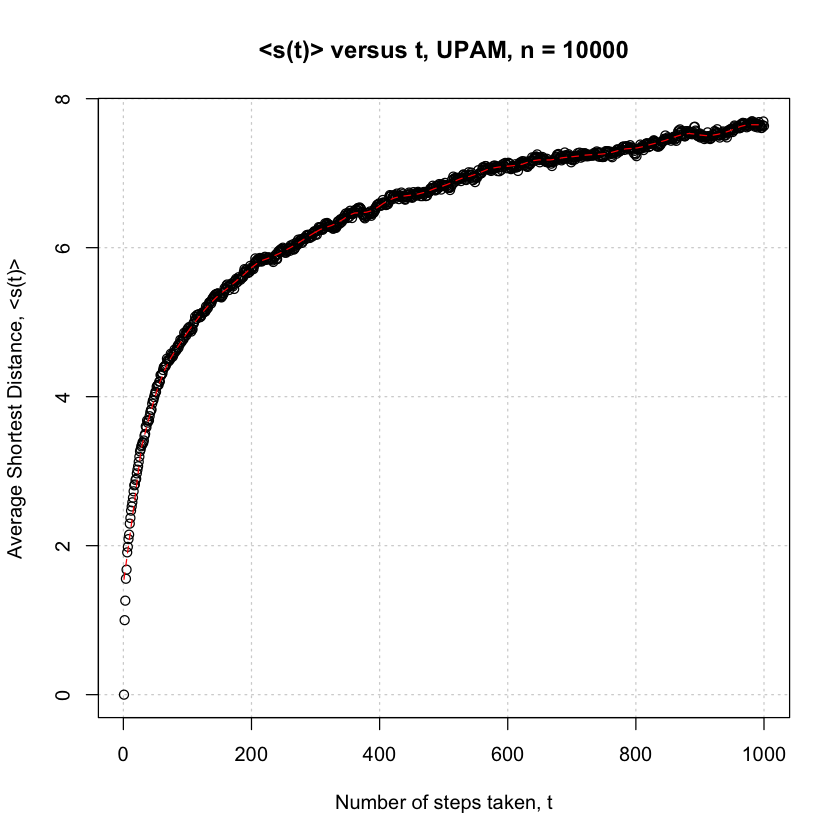

pdf 
  2

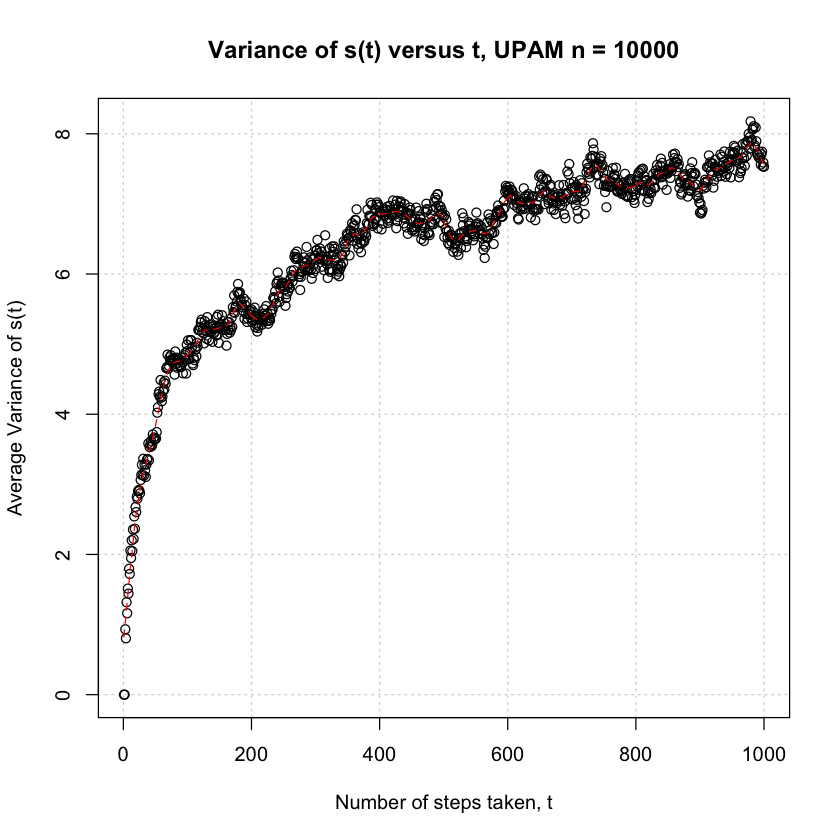

In [16]:
g <-  barabasi.game(10000, m=1, directed=FALSE)
s_t = matrix(data=0.0, nrow=1000, ncol=1000)
term_node_deg = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    if(is_connected(g)){
        gcc <- g
    }
    else{
        g.components <- clusters(g)
        ix <- which.max(g.components$csize)
        g.giant <- induced.subgraph(g, which(g.components$membership == ix))
        gcc <- g.giant
    }
    start = sample(V(gcc), 1)
    walked_nodes = random_walk(gcc, steps=1000, start)
    s_t[i,] = shortest.paths(gcc, walked_nodes, start)
    term_node_deg[i,1] = degree(gcc, walked_nodes[length(walked_nodes)])  
}
plot(seq(1,1000,1),colMeans(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Shortest Distance, <s(t)>',main="<s(t)> versus t, UPAM, n = 10000")
lines(lowess(seq(1,1000,1),colMeans(s_t),f = 0.05), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2da.eps')

plot(seq(1,1000,1),colVars(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Variance of s(t)',main="Variance of s(t) versus t, UPAM n = 10000")
lines(lowess(seq(1,1000,1),colVars(s_t),f = 0.03), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2db.eps')

In [17]:
print(diameter(g))

[1] 29


pdf 
  2

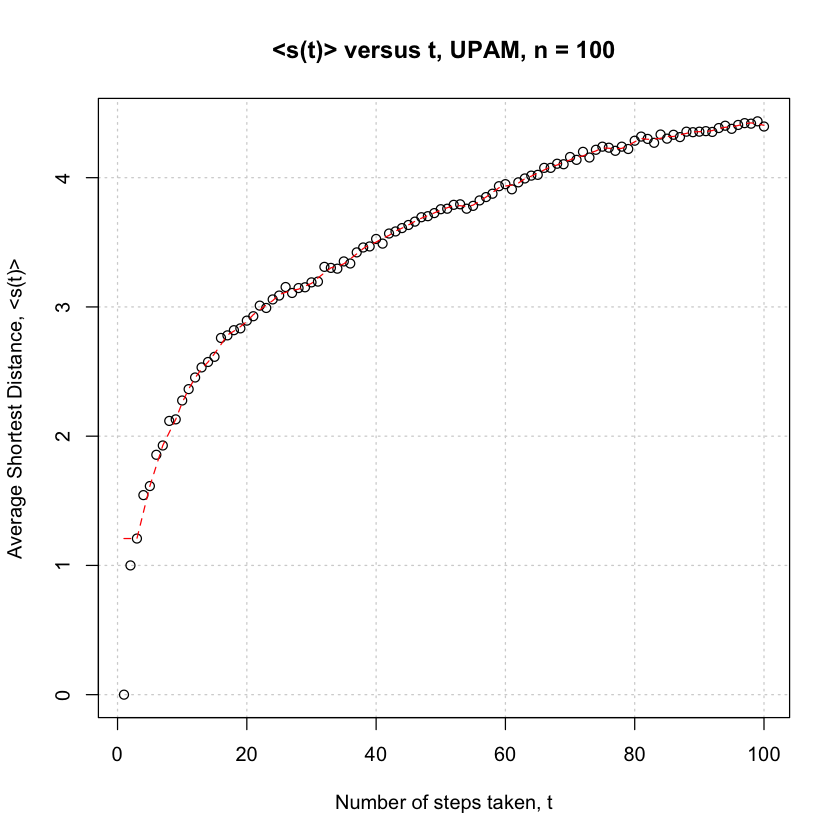

pdf 
  2

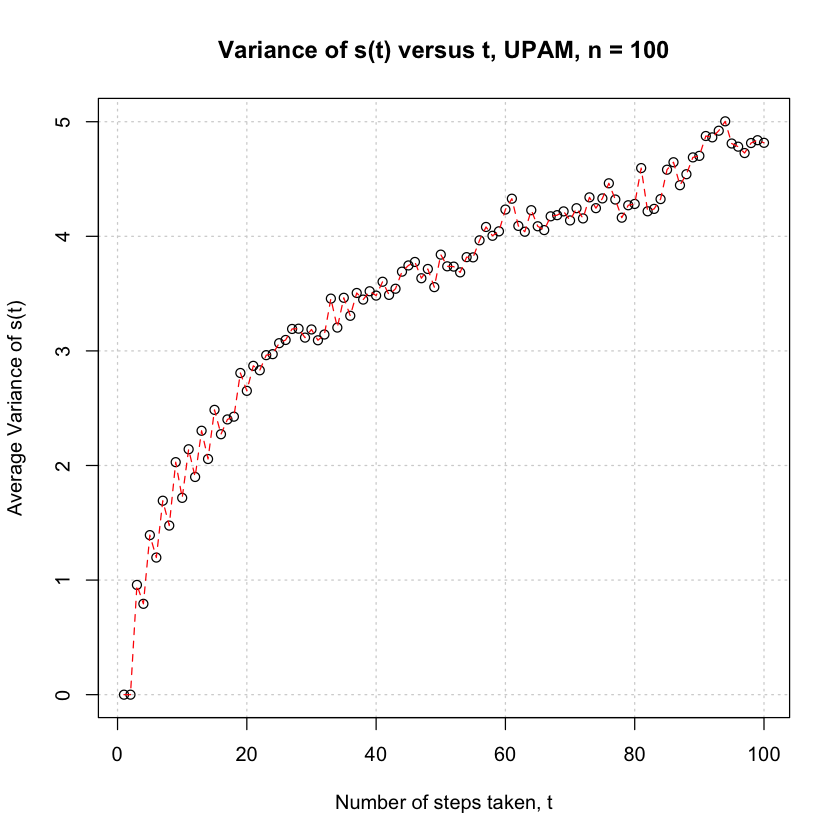

In [63]:
g <-  barabasi.game(100, m=1, directed=FALSE)
s_t = matrix(data=0.0, nrow=1000, ncol=100)
term_node_deg = matrix(data=0.0,nrow=1000,ncol=1)
for (i in 1:1000){
    if(is_connected(g)){
        gcc <- g
    }
    else{
        g.components <- clusters(g)
        ix <- which.max(g.components$csize)
        g.giant <- induced.subgraph(g, which(g.components$membership == ix))
        gcc <- g.giant
    }
    start = sample(V(gcc), 1)
    walked_nodes = random_walk(gcc, steps=100, start)
    s_t[i,] = shortest.paths(gcc, walked_nodes, start)
    term_node_deg[i,1] = degree(gcc, walked_nodes[length(walked_nodes)])  
}
plot(seq(1,100,1),colMeans(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Shortest Distance, <s(t)>',main="<s(t)> versus t, UPAM, n = 100")
lines(lowess(seq(1,100,1),colMeans(s_t),f = 0.05), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2dc.eps')

plot(seq(1,100,1),colVars(s_t),grid(), xlab = 'Number of steps taken, t', ylab = 'Average Variance of s(t)',main="Variance of s(t) versus t, UPAM, n = 100")
lines(lowess(seq(1,100,1),colVars(s_t),f = 0.03), col="red",lwd = 1,lty=2)
dev.copy2eps(file='2Q2dd.eps')

In [64]:
print(diameter(g))

[1] 13


## Question 3a

In [102]:
create_transition_matrix = function (g){
    vs = V(g)
    n = vcount(g)
    adj = as_adjacency_matrix(g)
    adj[diag(rowSums(adj) == 0)] = 1  
    z = matrix(rowSums(adj, , 1))
    transition_matrix = adj / repmat(z, 1, n)
    return(transition_matrix)
}

In [103]:
random_walk_custom = function (g, num_steps, start_node, transition_matrix = NULL, alpha=0.0, visit_mode="equal"){
    if(is.null(transition_matrix)){
            transition_matrix = create_transition_matrix(g) 
    }
    v = start_node
    walked_nodes = array(data=0.0, length(num_steps))
    
    if(visit_mode=='equal'){
        visit_probs=array(1/vcount(g), vcount(g))
    }
    else if (visit_mode=="page_rank"){
        pr = page_rank(g, directed=TRUE)$vector
        visit_probs= pr/sum( pr)
    }
    else if (visit_mode=="page_rank_median"){
        pr = page_rank(g, directed=TRUE)$vector
        df = data.frame("idx"=1:vcount(g), "val"=pr)
        df=df[order(df$val),]
        visit_probs=array(0, vcount(g))
        visit_probs[df$idx[(vcount(g) %/% 2):(vcount(g) %/% 2)+1]]=0.5   
    }
    else{
        visit_probs=array(1/vcount(g), vcount(g))
    }
    
    
    for(i in 1:num_steps){
        if(runif(1)<alpha){
            v = sample(1:vcount(g), 1, prob = visit_probs)   
        }
        else{
            PMF = transition_matrix[v, ]
            v = sample(1:vcount(g), 1, prob = PMF) 
        }
        walked_nodes[i] = v
    }  
    return(walked_nodes)
}

In [104]:
g1 <- barabasi.game(1000, m = 4, directed = TRUE)
g2 <- barabasi.game(1000, m = 4, directed = TRUE)
gf = add_edges(g1, c(t(as_edgelist(permute(g2, sample(vcount(g2)))))))

In [105]:
num_steps = 1000
visited_nodes=array(data=0.0, vcount(gf))
stable_node = ceiling(log(vcount(gf)))
for(i in 1:100){
    start = sample(1:vcount(gf), 1)
    walked_nodes = random_walk_custom(g = gf,num_steps = num_steps,transition_matrix = NULL,start_node = start,alpha = 0.0,visit_mode = 'equal')
    for (j in 1:length(walked_nodes)) {
        if (j > stable_node) {
            visited_nodes[walked_nodes[j]] = visited_nodes[walked_nodes[j]] + 1
        }
    }
}
node_prob = visited_nodes / ((num_steps-stable_node) * 100)


pdf 
  2

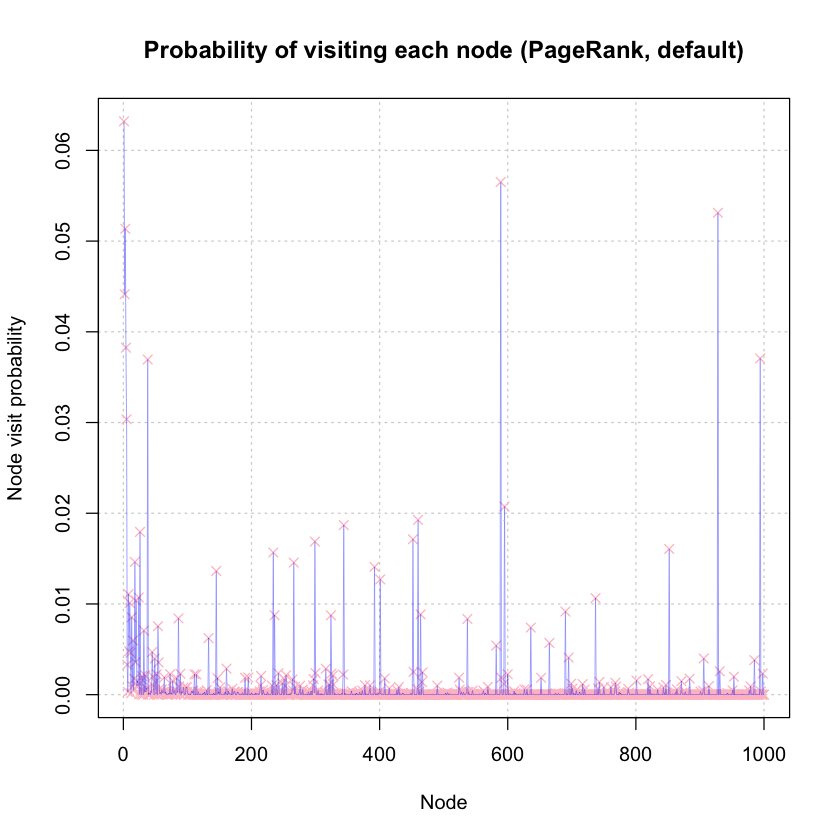

In [106]:
plot(seq(1,1000,1),node_prob,pch=4, xlab='Node', ylab='Node visit probability',main='Probability of visiting each node (PageRank, default)',col='pink',grid())
lines(node_prob,lwd=0.3,col="blue")
dev.copy2eps(file='2Q3aa.eps')

[1] "Pearson correlation coefficient: 0.902458"
[1] "Slope and intercept:"

Call:
lm(formula = node_prob ~ degree(gf))

Coefficients:
(Intercept)   degree(gf)  
 -0.0015616    0.0001605  



pdf 
  2

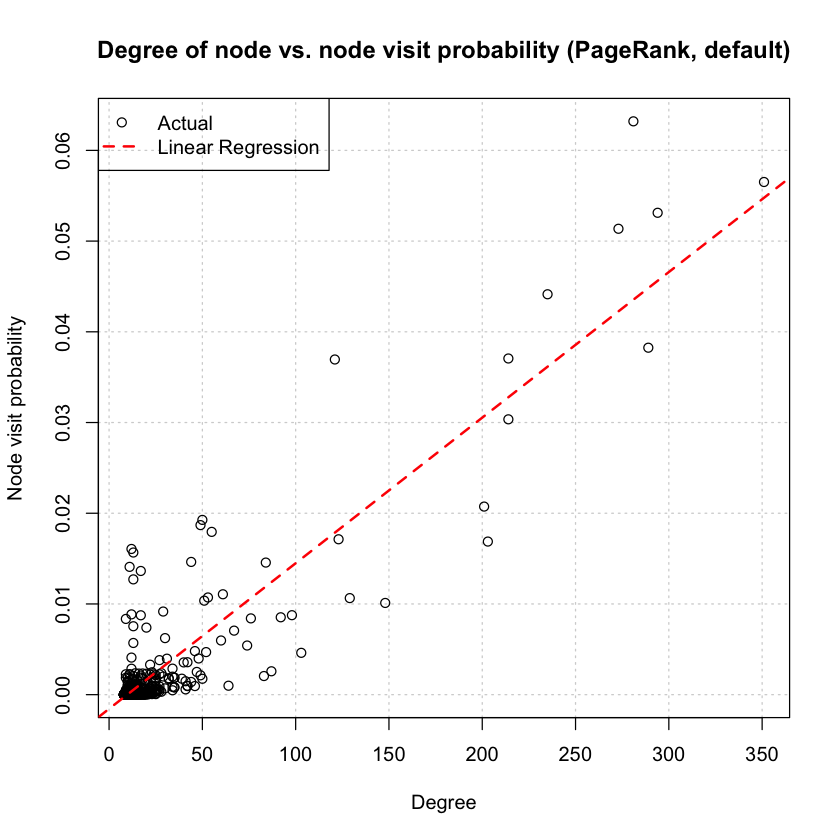

In [108]:
plot(degree(gf), node_prob , xlab='Degree', ylab='Node visit probability',main="Degree of node vs. node visit probability (PageRank, default)",grid())
abline(lm(node_prob ~ degree(gf)),col="red",lwd=2,lty=2)
legend('topleft', legend = c("Actual","Linear Regression"),
       lty = c(NA, 2), lwd = c(1,2), pch=c(1,NA),
       col = c('black','red'))
print(sprintf("Pearson correlation coefficient: %f",cor(degree(gf), node_prob)))
print("Slope and intercept:")
print(lm(node_prob ~ degree(gf)))
dev.copy2eps(file='2Q3ab.eps')

## Question 3b

In [109]:
num_steps = 1000
visited_nodes=array(data=0.0, vcount(gf))
stable_node = ceiling(log(vcount(gf)))
for(i in 1:100){
    start = sample(1:vcount(gf), 1)
    walked_nodes = random_walk_custom(g = gf,num_steps = num_steps,transition_matrix = NULL,start_node = start,alpha = 0.15,visit_mode = 'equal')
    for (j in 1:length(walked_nodes)) {
        if (j > stable_node) {
            visited_nodes[walked_nodes[j]] = visited_nodes[walked_nodes[j]] + 1
        }
    }
}
node_prob = visited_nodes / ((num_steps-stable_node) * 100)


pdf 
  2

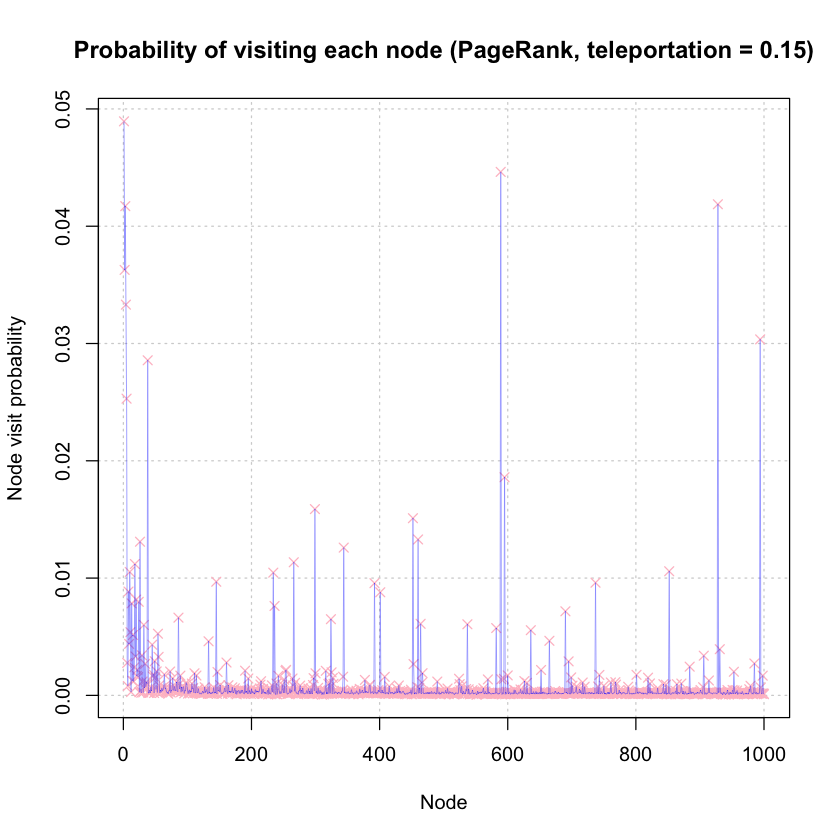

In [112]:
plot(seq(1,1000,1),node_prob,pch=4, xlab='Node', ylab='Node visit probability',main='Probability of visiting each node (PageRank, teleportation = 0.15)',col='pink',grid())
lines(node_prob,lwd=0.3,col="blue")
dev.copy2eps(file='2Q3ba.eps')

[1] "Pearson correlation coefficient: 0.930428"
[1] "Slope and intercept:"

Call:
lm(formula = node_prob ~ degree(gf))

Coefficients:
(Intercept)   degree(gf)  
 -0.0010949    0.0001313  



pdf 
  2

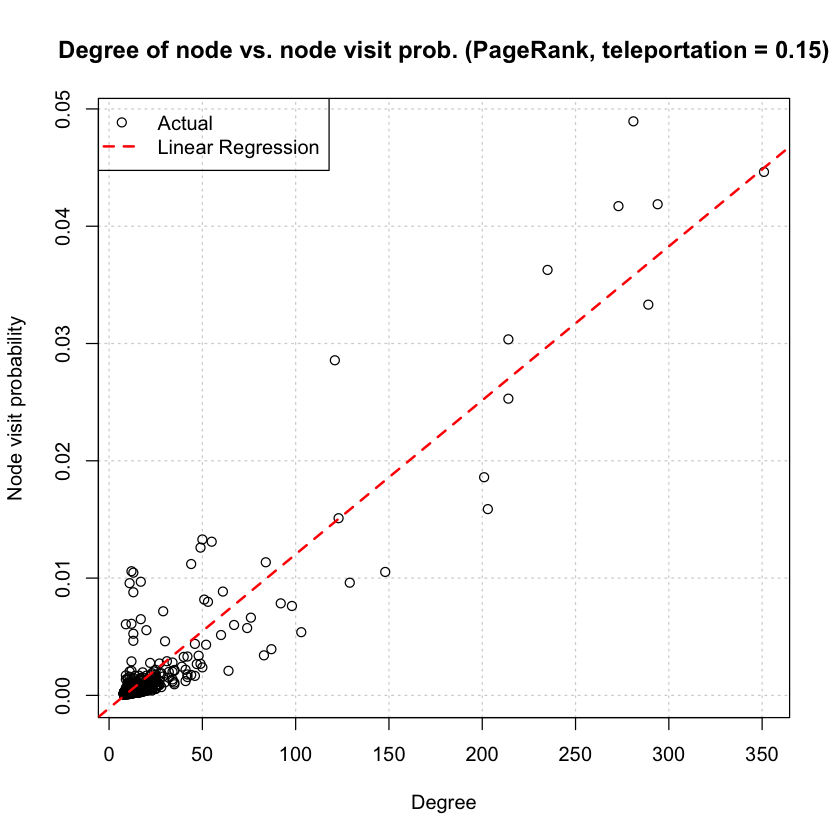

In [114]:
plot(degree(gf), node_prob , xlab='Degree', ylab='Node visit probability',main="Degree of node vs. node visit prob. (PageRank, teleportation = 0.15)",grid())
abline(lm(node_prob ~ degree(gf)),col="red",lwd=2,lty=2)
legend('topleft', legend = c("Actual","Linear Regression"),
       lty = c(NA, 2), lwd = c(1,2), pch=c(1,NA),
       col = c('black','red'))
print(sprintf("Pearson correlation coefficient: %f",cor(degree(gf), node_prob)))
print("Slope and intercept:")
print(lm(node_prob ~ degree(gf)))
dev.copy2eps(file='2Q3bb.eps')

## Question 4a

In [115]:
num_steps = 1000
visited_nodes=array(data=0.0, vcount(gf))
stable_node = ceiling(log(vcount(gf)))
for(i in 1:100){
    start = sample(1:vcount(gf), 1)
    walked_nodes = random_walk_custom(g = gf,num_steps = num_steps,transition_matrix = NULL,start_node = start,alpha = 0.15,visit_mode = 'page_rank')
    for (j in 1:length(walked_nodes)) {
        if (j > stable_node) {
            visited_nodes[walked_nodes[j]] = visited_nodes[walked_nodes[j]] + 1
        }
    }
}
node_prob = visited_nodes / ((num_steps-stable_node) * 100)

pdf 
  2

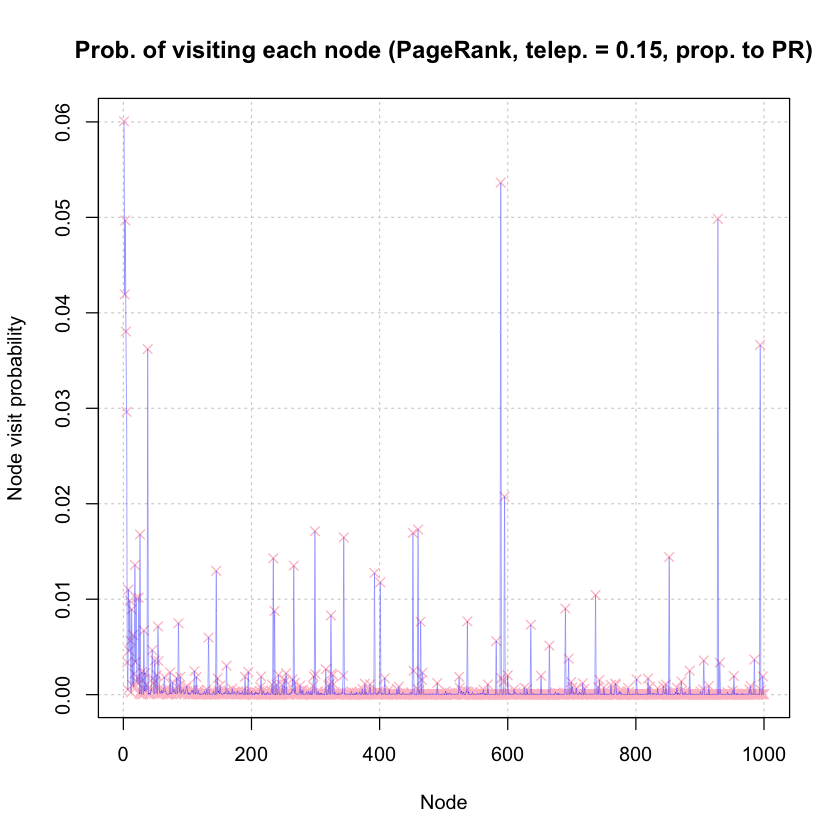

In [116]:
plot(seq(1,1000,1),node_prob,pch=4, xlab='Node', ylab='Node visit probability',main='Prob. of visiting each node (PageRank, telep. = 0.15, prop. to PR)',col='pink',grid())
lines(node_prob,lwd=0.3,col="blue")
dev.copy2eps(file='2Q4aa.eps')

[1] "Pearson correlation coefficient: 0.910936"
[1] "Slope and intercept:"

Call:
lm(formula = node_prob ~ degree(gf))

Coefficients:
(Intercept)   degree(gf)  
  -0.001473     0.000155  



pdf 
  2

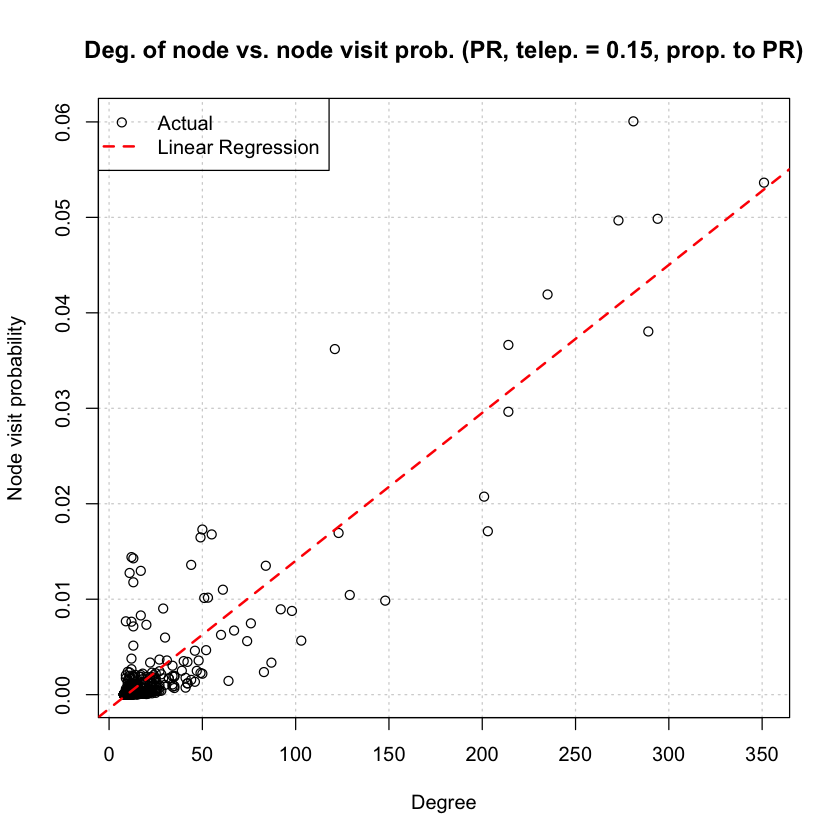

In [118]:
plot(degree(gf), node_prob , xlab='Degree', ylab='Node visit probability',main="Deg. of node vs. node visit prob. (PR, telep. = 0.15, prop. to PR)",grid())
abline(lm(node_prob ~ degree(gf)),col="red",lwd=2,lty=2)
legend('topleft', legend = c("Actual","Linear Regression"),
       lty = c(NA, 2), lwd = c(1,2), pch=c(1,NA),
       col = c('black','red'))
print(sprintf("Pearson correlation coefficient: %f",cor(degree(gf), node_prob)))
print("Slope and intercept:")
print(lm(node_prob ~ degree(gf)))
dev.copy2eps(file='2Q4ab.eps')

## Question 4b

In [119]:
num_steps = 1000
visited_nodes=array(data=0.0, vcount(gf))
stable_node = ceiling(log(vcount(gf)))
for(i in 1:100){
    start = sample(1:vcount(gf), 1)
    walked_nodes = random_walk_custom(g = gf,num_steps = num_steps,transition_matrix = NULL,start_node = start,alpha = 0.15,visit_mode = 'page_rank_median')
    for (j in 1:length(walked_nodes)) {
        if (j > stable_node) {
            visited_nodes[walked_nodes[j]] = visited_nodes[walked_nodes[j]] + 1
        }
    }
}
node_prob = visited_nodes / ((num_steps-stable_node) * 100)

pdf 
  2

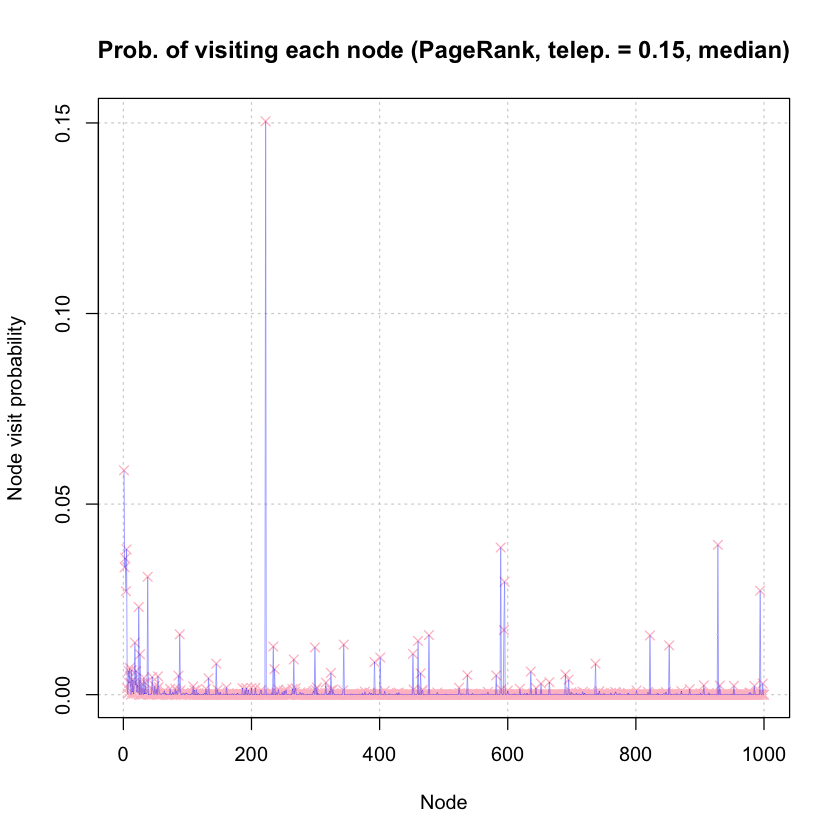

In [120]:
plot(seq(1,1000,1),node_prob,pch=4, xlab='Node', ylab='Node visit probability',main='Prob. of visiting each node (PageRank, telep. = 0.15, median)',col='pink',grid())
lines(node_prob,lwd=0.3,col="blue")
dev.copy2eps(file='2Q4ba.eps')

[1] "Pearson correlation coefficient: 0.563365"
[1] "Slope and intercept:"

Call:
lm(formula = node_prob ~ degree(gf))

Coefficients:
(Intercept)   degree(gf)  
  -0.001044     0.000128  



pdf 
  2

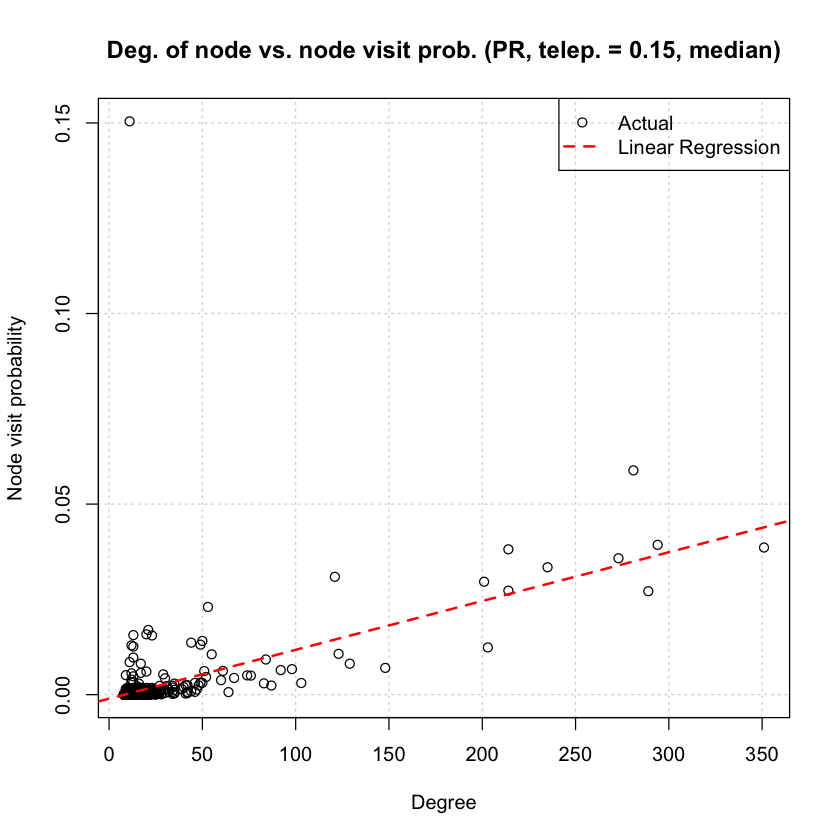

In [122]:
plot(degree(gf), node_prob , xlab='Degree', ylab='Node visit probability',main="Deg. of node vs. node visit prob. (PR, telep. = 0.15, median)",grid())
abline(lm(node_prob ~ degree(gf)),col="red",lwd=2,lty=2)
legend('topright', legend = c("Actual","Linear Regression"),
       lty = c(NA, 2), lwd = c(1,2), pch=c(1,NA),
       col = c('black','red'))
print(sprintf("Pearson correlation coefficient: %f",cor(degree(gf), node_prob)))
print("Slope and intercept:")
print(lm(node_prob ~ degree(gf)))
dev.copy2eps(file='2Q4bb.eps')

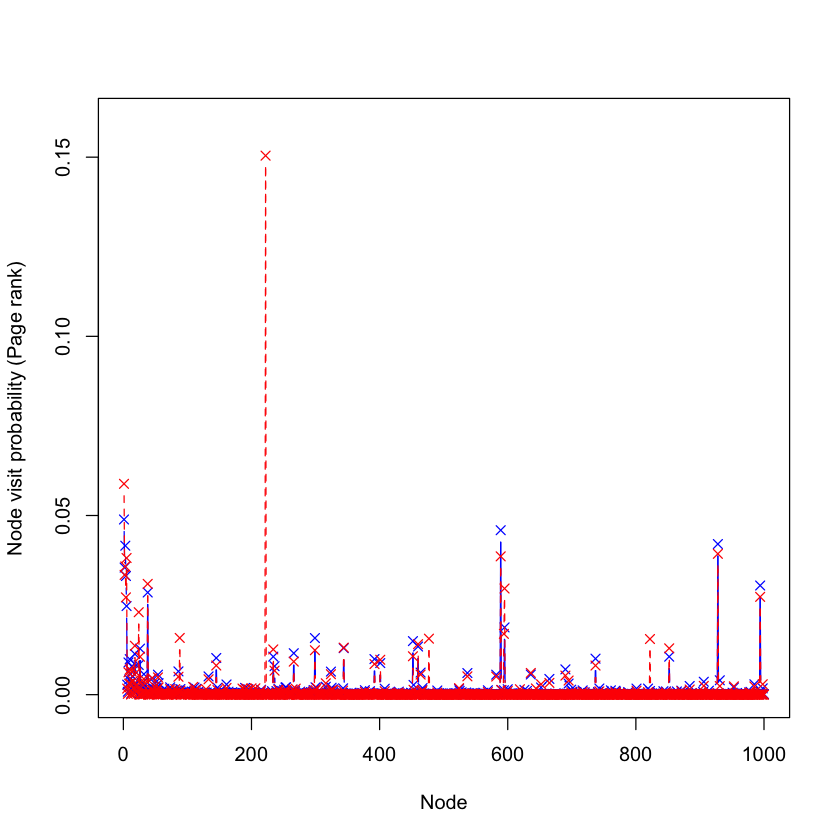

In [170]:
pageranks = page_rank(gf)$vector
plot(seq(1,1000,1),pageranks,col="blue",type='b',pch=4,ylim=c(0,0.16), xlab='Node', ylab='Node visit probability (Page rank)')
points(node_prob, col="red",type='b',lty=2,pch=4)